## Introduction
Github repository containing notebook and important plots: <br>
<a href="https://github.com/deryaaricigil/FYS-STK4155-Project-1">GitHubP1</a>
### Problem
In this project we are first presented the Franke function: <br>
$$
f_1(x,y) = 0.75e^{-(0.25(9x-2)^2-0.25(9y-2)^2} \\
f_2(x,y) = 0.75e^{-\frac{(9x+1)^2}{49.0}-0.1(9y+1)} \\
f_3(x,y) = 0.5e^{-\frac{(9x-7)^2}{4.0}-0.25(9y-3)^2} \\
f_4(x,y) = -0.2e^{-(9x-4)^2-(9y-7)^2} \\
f(x,y) = f_1(x,y)+f_2(x,y)+f_3(x,y)+f_4(x,y)
$$

where $f(x,y)$ is the Franke function, on the intervals $x\in[0,1]$ and $y\in[0,1]$. <br>
To properly show this surface, a meshgrid of values between zero and one were made, and the Franke function evaluated at all points. <br>
In exercises 1-5, we are exploring regression methods; ordinary least squares (henceforth referred to as OLS), Ridge, and Lasso methods, applied on a training data set of the Franke function to see if we can model the data in the function. <br>
More precisely, we assume that the data is given by <br>
$$ 
z = f(x,y) + \epsilon,
$$ 
where we assume that $\epsilon \sim \mathcal{N}(0,\sigma)$ is normally distributed with zero mean and a standard deviation of $\sigma$. <br>
We are trying to make a polynomial fit to this data, with maximal degree k: 
$$
\tilde{f}(x,y) = \sum_{i=0}^k\sum_{j=0}^i \beta_{n}x^{i-j}y^j, 
$$
where $n\in[0, \frac{(k+1)(k+2)}{2}-1]\in\mathbb{N}$, and the $\beta_n$'s are the weights. which can be rewritten like 
$$
\tilde{f}(\mathbf{m}) = \mathbf{m^T}\mathbf{\beta}.
$$
Here $\mathbf{m}$ are all the elements of the polynomial: 
$$
\mathbf{m^T} = [1, x, y, x^2, xy, y^2, \dots, xy^{k-1}, y^k], 
$$
and $\mathbf{\beta}$ are the corresponding weights: 
$$
\mathbf{\beta^T} = [\beta_0, \beta_1, \dots, \beta_p], 
$$
where $p = \frac{(k+1)(k+2)}{2}-1$. 

### Making our design matrix
We are using $N_x$ values for x and $N_y$ values for y. The design matrix is made by using all the different arguments in our dataset, and setting their values into $\mathbf{m^T}$. For us, that is a meshgrid, so for any value of x there are $N_y$ values of y, and for any value of y there are $N_x$ values of x. Everytime we insert a different set of values, we make a row in the design matrix. Our design matrix will therefore have dimensions $(N_xN_y)\times (p+1)$. The design matrix will look something like this: 
$$
X = \begin{vmatrix}
    1 & x_1 & y_1 & x_1^2 & \dots & x_1y_1^{p-1} & y_1^{p} \\
    1 & x_1 & y_2 & x_1^2 & \dots & x_1y_2^{p-1} & y_2^{p} \\
    1 & x_1 & y_3 & x_1^2 & \dots & x_1y_3^{p-1} & y_3^{p} \\
    \vdots & \vdots & \vdots & \vdots & \vdots & \vdots & \vdots \\
    1 & x_{N_x} & y_{N_y-2} & x_{N_x}^2 & \dots & x_{N_x}y_{N_y-2}^{p-1} & y_{N_y-2}^p \\
    1 & x_{N_x} & y_{N_y-1} & x_{N_x}^2 & \dots & x_{N_x}y_{N_y-1}^{p-1} & y_{N_y-1}^p \\
    1 & x_{N_x} & y_{N_y} & x_{N_x}^2 & \dots & x_{N_x}y_{N_y}^{p-1} & y_{N_y}^p \\
    \end{vmatrix}
$$


#### Why do we make this matrix? 
We want $\tilde{f}(\mathbf{X})$ to be as close to z as possible, even for data we haven't trained on. What will be done in this project, is that a dataset (z) will be created, then a design matrix will be made based on the input to the function that created the dataset. Then the dataset and the design matrix will be split into a training set and a test set (ratio = 4:1). The values of the training and testing sets will be randomly picked. What will happen now is that the values of beta that creates an $\tilde{f}$ that is as close to the dataset as possible, based on the training set.

#### How do we measure proximity to dataset? 
Here is where the cost function comes in. The cost function calculates the squared of the distance between the points in the dataset and the fitted function: 
$$
C(\beta) = \sum_{i=0}^N(z_i-\tilde{f}_i)^2, 
$$
where $N$ is the number of values in z we are calculating the proximity to. To minimize this function, we find the derivate with respect to $\beta$ and set it equal zero:  
$$
\frac{dC}{d\mathbf{\beta}} = \frac{d}{d\mathbf{\beta}}(\mathbf{z}^2-2X^T\mathbf{\beta}\mathbf{z}+ \mathbf{\beta^T}XX^T\mathbf{\beta}) = 0, 
$$
which yields our favourite ordinary least squares $\beta$: 
$$
\beta = (X^TX)^{-1}X^T\mathbf{z}.
$$
The $\beta$ calculated based on the training set of the design matrix and the training set of z will then be applied to try and predict the values in the testing set of z, by using $\tilde{f}$: 
$$
\tilde{f} = X_{test}\beta. 
$$

### Methods used
#### Ordinary least squares
Above the cost-function is what in mathematics is called the $L_2$-norm of the difference between the two vectors $\mathbf{z}$ (dataset) and $X^T\mathbf{\beta}$ (model), and we seek to minimize this norm. This leads to ordinary least squares method, written mathematically like this: 
$$
\mathbf{\beta}_{OLS} = arg min_{\mathbf{\beta}\in\mathbb{R}^p}||\mathbf{z}-X\mathbf{\beta}||_2^2, 
$$
where we calculate the $\mathbf{\beta}_{OLS}$ using the training set of z and X, and then apply it on our test set to see if it is a good predictor of the data behaviour. As we saw above this leads to $\mathbf{\beta}$ being equal to: 
$$
\mathbf{\beta}_{OLS} = (X^TX)^{-1}X^T\mathbf{z}.
$$

#### Ridge regression
The Ridge regression method adds something called a regularization parameter $\lambda$, which is multiplied with the $L_2$-norm of $\mathbf{\beta}$. It will be added to the $L_2$-norm of the difference between the datapoints and the feature matrix multiplied with $\mathbf{\beta}$:  
$$
\mathbf{\beta}_{Ridge} = argmin_{\mathbf{\beta}\in\mathbb{R}^p}||\mathbf{z}-X\mathbf{\beta}||_2^2+\lambda||\mathbf{\beta}||_2^2,
$$
To minimize this function we again apply derivation with respect to beta, and set it equal to 0. This is very similar to the OLS-method, but now we will have an additional element: 
$$
\frac{dC(\mathbf{\beta})}{d\mathbf{\beta}} = \frac{d}{d\mathbf{\beta}}(\mathbf{z}^2-2X^T\mathbf{\beta}\mathbf{z}+ \mathbf{\beta^T}XX^T\mathbf{\beta} + \lambda\mathbf{\beta}^T\mathbf{\beta}) = 0
$$
which further becomes: 
$$
X^T\mathbf{z} = (XX^T+\lambda I)\mathbf{\beta}, 
$$
which in turn yields $\mathbf{\beta}_{Ridge}$: 
$$
\mathbf{\beta}_{Ridge} = (X^TX+\lambda I)^{-1}X^T\mathbf{z}.
$$
This will be applied in the exactly same manner as the OLS-regression method: Use training sets to find $\mathbf{\beta}_{Ridge}$ and then use it on $X_{test}$ to find a prediction for $\mathbf{z}_{test}$. 

#### LASSO regression
LASSO is an acronym, and stands for Least Absolute Shrinkage and selection operator. It also uses a regularization parameter, but this time it's multiplied with the $L_1$-norm of $\mathbf{\beta}$, and thus the expression we want to minimize, and thus find the optimal $\mathbf{\beta}$, becomes: 
$$
\mathbf{\beta}_{Lasso} = argmin_{\mathbf{\beta}\in\mathbb{R}^p}||\mathbf{z}-X\mathbf{\beta}||_2^2+\lambda||\mathbf{\beta}||_1.
$$
The $L_1$-norm is just the sum of the absolute values of the parameters of $\mathbf{\beta}$. You can make conditional statements about the behaviour of this function, but we won't go into it here. 
We used the module scikit-learn, which has the LASSO function built in, when we wanted to perform LASSO regression. 

#### Measuring error between predictions and dataset
We will use something that is similar to the cost function itself to measure error, namely the mean-squared error. The mean-squared error finds the distance between the values of the dataset and the prediction, squares it, then divides by the number of datapoints: 
$$
MSE(z, \tilde{f}) = \frac{1}{N}\sum_{i=0}^{N-1} (z_i-\tilde{f}_i)^2.
$$
Another useful tool to measure the error is $R^2$-score, which is defined as: 
$$
R^2 = 1 - \frac{SS_{res}}{SS_{tot}}, 
$$
where $SS_{res}$ is the sum of squares of of the difference between the model and the data (the sum of squares of residuals), and $SS_tot$ is the total sum of squares, the data minus the mean of the data squared: 
$$
R^2 = 1 - \frac{\sum_{i=0}^{N-1}(z_i-\tilde{f}_i)^2}{\sum_{i=0}^{N-1}(z_i-\bar{z})^2}
$$

### Feature scaling
All scaling done in this project is of the form: <br>
For the features: <br>
$ x' = x-\bar{x},$ <br>
where $x'$ is the column vector minus its mean. <br>
For the response variables: <br>
$ z' = z - \bar{z},$ <br>
where $z'$ is the response vector minus its mean. 


### Resampling techniques
The central limit theorem states that if you sample a large number of times from the same dataset, your estimates on the samples from this dataset becomes normally distributed in the limit where the number of resamplings goes to infinity. This is why we resample, we want to find estimates for the errors in our calculations. 
#### The Bootstrap resampling technique
The Bootstrap resampling technique simply resamples randomly with replacement(!) from the dataset a specific number of times, let's say n, and then we perform our calculations for each iteration. Take the mean-squared error, for example. For each iteration of resampling, we calculate the mean-squared error. When is looped over all iterations, we just calculated the mean of the mean-squared error : 
$$
\bar{MSE} = \frac{1}{n}\sum_{i=0}^{n}MSE_i. 
$$
Further we could find the standard deviation of this mean-squared error: 
$$
\sigma_{MSE} = \sqrt{\sum_{i=0}^{n}(MSE_i-\bar{MSE})^2}.
$$
From this point we could get a confidence interval. We must keep in mind though, that we are not actually finding the true normal distribution, as we are not resampling an infinite amount of times, but we can get an estimate for the confidence interval, the mean and it's variance. This can be generalized to any property of the dataset we would like to calculate. 
#### k-fold cross-validation technique
We have a dataset, and the k-fold cross-validation technique, splits this dataset into k folds. Each fold gets to be the test set once, and thus gets to be the training set k-1 times. For each k, we calculate the property we want to examine, and after all folds have had its run, we just take the mean of these calculations. This is done to validate our calculations.  

### Results from exercise 4 and 5
#### Comparison of MSE and R2-score

##### Ridge regression on dataset created through Franke function
In the figure below, a contour map of the MSE against lambda and polynomial degree is plotted. The lambdas are $\lambda=10^i$ for all integers i from -15 to 5. The degree of the polynomial is the other axis, which ranges from 0 to 19. The number of datapoints in the meshgrid is 1024. The figure will be in the Github-repository linked to in the introduction. 

![BestlambdadegreeRidgeN_32.png](attachment:BestlambdadegreeRidgeN_32.png)

The optimal parameters was found to be $\lambda_{optimal}=10^{-5}$ and a degree of the polynomial of 15. The 95 % confidence interval of the minimum of $MSE_{Ridge}$ is 
$$
MSE_{Ridge} = 8.83\dot 10^{-3} \pm 0.93\dot 10^{-3}
$$
Best R2: 0.8777741112024953, std: 0.006536959537957135
and the best R2: 
$$
R2_{Ridge} = 0.878 \pm 0.007
$$

##### Lasso regression on dataset created through Franke function
There is a contour plot in the Github-repository linked to in the introduction. Exactly the same procedure as for the Ridge regression, the optimal parameters lambda and degree of polynomial was found. The optimal parameters were $\lambda=10^{-3}$ and polynomial degree of 16. They yielded the 95% confidential interval for the MSE:  
$$
MSE_{LASSO} = 9.269\dot 10^{-2} \pm 1.5\dot 10^{-4}
$$
and the R2-score wasn't recorded in time. 

### Results and discussion of exercise 6
#### Data preparation
The terrain data used in exercise 6 is one of the example terrains from Norway: SRTM_data_Norway_1.tif. 
The data had to be cut significantly for us to be able to process the data in a reasonable time. The terrain has been reduced from a 3601x1801 matrix to a 30x30 matrix, giving us 900 datapoints to work with. 
#### Results
##### OLS
When studying the OLS against the degree of polynomial fit, using the bootstrap resampling technique with 100 iterations of resampling, we found that the minimum MSE was when we tried fitting the data to a polynomial of degree 17. The magnitude of the MSE was 6.4, but the variance was large. Therefore, the confidence interval of the MSE using 100 bootstrap resamplings is
$$
MSE_{OLS} = 6.4 \pm 13.1.
$$
The R2-score was calculated to be 0.992, but variance wasn't calculated. 
The reason we didn't increase the number of resampling iterations is due to the enormous amount of time it would take to run the LASSO fit with that number of iterations, and we would like to compare. 

##### Ridge
When studying the Ridge, we wanted first to find the optimal parameters for it. Therefore, we ran a bootstrap resample with 100 iterations, calculating MSE and R2 for each iteration, on all $\lambda=10^i$, for all integers i in the range $[-15, 5]$, and for each value of lambda we checked all polynomial degrees in the range $[0, 19]$. We have a contourplot for this in the figure below. We found the lowest MSE to be when $\lambda=10^{-8}$ and the degree of the polynomial to be 19. Here we found that the 95% confidence interval of the MSE value was: 
$$
MSE_{Ridge} = 16.1 \pm 2.3.
$$
The 95% confidence interval of the R2-score: 
$$
R2_{Ridge}0.9830 \pm 0.0025
$$
Contourplot of MSE using Ridge regression with parameters lambda and degree of polynomial is shown in the figure named BestlambdadegreeRidgeTERRAIN_N_30.png, in the Github-repo. 
![BestlambdadegreeRidgeTERRAIN_N_30.png](attachment:BestlambdadegreeRidgeTERRAIN_N_30.png)

##### Lasso
For Lambda, we used the same procedure as for Ridge, with same intervals for $\lambda$ and the same range for the degree of the polynomial. The contourplot is shown in figure {ref}. The lowest MSE was found to be when $\lambda=10^{-}$ and the degree of the polynomial was . Here we found the 95% confidence interval of the MSE to be: 
$$
MSE_{LASSO} = 22.0 + 1.4
$$
The R2-score was calculated to be 0.9720, unknown standard deviation, but probably low as the standard deviation in the MSE is so small compared to the mean. 
Contourplot of MSE using Lasso regression with parameters lambda and degree of polynomial is shown in the figure named BestlambdadegreeLassoTerrain_N_30.png, in the Github-repo. 



### Importing needed libraries and functions

In [1]:
#imports
import os
import numpy as np
from sklearn.model_selection import train_test_split
import sklearn.linear_model as skl
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer
import matplotlib 
matplotlib.rcParams['text.usetex']=True
import matplotlib.pyplot as plt
from sklearn.utils import resample
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from random import random, seed
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures

In [2]:
# Where to save the figures and data files
PROJECT_ROOT_DIR = "Results2"
FIGURE_ID = "Results2/FigureFiles"
DATA_ID = "DataFiles2/"

if not os.path.exists(PROJECT_ROOT_DIR):
    os.mkdir(PROJECT_ROOT_DIR)

if not os.path.exists(FIGURE_ID):
    os.makedirs(FIGURE_ID)

if not os.path.exists(DATA_ID):
    os.makedirs(DATA_ID)

def image_path(fig_id):
    return os.path.join(FIGURE_ID, fig_id)

def data_path(dat_id):
    return os.path.join(DATA_ID, dat_id)

def save_fig(fig_id):
    plt.savefig(image_path(fig_id) + ".png", format='png')

### Useful functions

In [3]:
# Calculates value of Franke function
def FrankeFunction(x,y):
    term1 = 0.75*np.exp(-(0.25*(9*x-2)**2) - 0.25*((9*y-2)**2))
    term2 = 0.75*np.exp(-((9*x+1)**2)/49.0 - 0.1*(9*y+1))
    term3 = 0.5*np.exp(-(9*x-7)**2/4.0 - 0.25*((9*y-3)**2))
    term4 = -0.2*np.exp(-(9*x-4)**2 - (9*y-7)**2)
    return term1 + term2 + term3 + term4

# Creates design matrix
def create_X(x, y, n ):
	if len(x.shape) > 1:
		x = np.ravel(x)
		y = np.ravel(y)

	N = len(x)
	l = int((n+1)*(n+2)/2)		# Number of elements in beta
	X = np.ones((N,l))

	for i in range(1,n+1):
		q = int((i)*(i+1)/2)
		for k in range(i+1):
			X[:,q+k] = (x**(i-k))*(y**k)

	return X

# Calculates R²-score
def R2(y_data, y_model):
    return 1 - np.sum((y_data - y_model) ** 2) / np.sum((y_data - np.mean(y_data)) ** 2)

# Calculates mean squared error
def MSE(y_data,y_model):
    n = np.size(y_model)
    return np.sum((y_data-y_model)**2)/n

# Calculates OLS beta
def OLS_beta(X, z): 
    beta = np.linalg.pinv(X.T @ X) @ X.T @ z
    return beta

# Calculates confidence interval
def confidence_interval(var_beta, z, beta_best):
    CI = []
    for i in range(len(beta_best)):
        CI.append((beta_best[i] - z * np.sqrt(var_beta[i]),beta_best[i] + z * np.sqrt(var_beta[i])))

    return CI

## EXERCISE 1 
Ordinary Least Square (OLS) on the Franke function. 

#### _Finding which polynomial fit to use_

Here OLS is implemented for 40 data points with and without noise and up to 5th degree polynomial. As shown below, due to the lack of a spike in MSE, the model does not overfit since the number of data points is a much larger value compared to the maximum degree. Overfitting may be observed in the following scenarios:

1) Decreasing the number of data

2) Increasing the max degree 

We tried the second one and increased the max degree of polynomial. 


_Overfitting:_

Overfitting transpires when the model makes an almost perfect fit for your train data and fits almost every point so the model can only predict the train data perfectly and can no longer predict a new set of data.
Basically, your model is supposed to grasp the general patten of the data so it can predict the new batch of data with the same pattern. but overfitting means getting lost in the detail of the training data.

To prevent overfitting we can watch out for MSE of the test data. Generally, larger degree of polynomila result in better MSE because the model tries fits the data points better. The model goes put of its way to fit the points. As we can for degree = 0 the fit is linear and the simplest model (underfitting). The more complex the model the better MSE. But we have to look out for overfitting.

We calculate MSE for train and test for each polynomial degree and plot it to investigate. It is clear in the plots that after a certain polynomial degree the MSE for test start to divert from the train and gets worst while the train gets better and better. So the minimum test MSE before overfitting is actualy the best model. 
It can olso be obsered with $R^{2}$ score as it goes to 1 with higher polynomial degree.

#### _Plots_

The two groups of plots below, one group contains up to fifth order polynomial which leads to no visible overfitting and the other contains up to 42nd order. We show the scaling without noise up to fifth order polynomial and due to the very slight or no difference between scaled and non-scaled data we decided to make the following plots.

Without noise: Scaled and non-scaled up to 5th order polynomial

With noise: Scaled and non-scaled up to 42nd order polynomial

### _1.1 Without noise: Scaled and non-scaled up to 5th order polynomial_

#### 1.1.1 Scaled up to 5th order polynomial

Here we can see that without noise the scaling has no effect on MSE or $R^{2}$.

Degree of lowest MSE: 5
Minimal MSE: 1.689466e-03
Best R2-score: 0.9791398982941494
Degree of best R2: 5


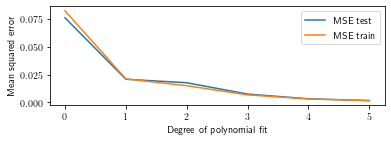

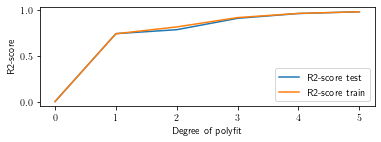

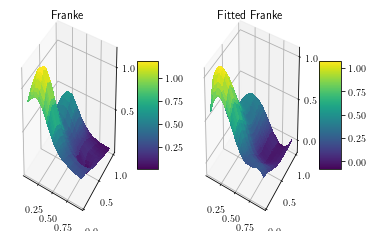

In [9]:
np.random.seed(3155)

N = 40 # The meshgrid will contain NxN points
maxdegree = 6
# Picking out N randomized (uniform distribution) values of x and y between 0 and 1
ax_row = np.random.uniform(0, 1, size=N) 
ax_col = np.random.uniform(0, 1, size=N)
# Sorting the values by value
ind_sort_row = np.argsort(ax_row)
ind_sort_col = np.argsort(ax_col)

ax_row_sorted = ax_row[ind_sort_row]
ax_col_sorted = ax_col[ind_sort_col]
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
# Creating a meshgrid of the sorted x and y-values
colmat, rowmat = np.meshgrid(ax_col_sorted, ax_row_sorted)

# Added noise to the meshgrid
noise_str = 0.0
noise = np.random.randn(N, N)

# Calculating the value of the z-values on the meshgrid.
z = FrankeFunction(colmat, rowmat) + noise_str * noise  
#z = FrankeFunction(mx, my) + noise_str * noise
# Changing the dim of z from a meshgrid to a one-dim array. 
z = z.ravel() 

# Initiating storage vectors for calculations interesting to us
MSE_test = np.zeros(maxdegree)
MSE_train = np.zeros(maxdegree)
R2_test = np.zeros(maxdegree)
R2_train = np.zeros(maxdegree)
degrees = np.zeros(maxdegree)


for i in range(maxdegree): 
    degrees[i] = i
    X = create_X(colmat, rowmat, n=i)
    #X = create_X(mx, my, n=i)
    X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
    # Scaling
    X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    X_train -= X_train_mean; X_test -= X_train_mean; z_train -= z_train_mean; z_test -= z_train_mean
    # Calculating beta and variances. 
    beta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
    var_beta = np.diagonal(np.linalg.pinv(X_train.T @ X_train))
    ztilde = X_train @ beta
    zpred = X_test @ beta
    #print("Beta %1d :" % (i+1))
    #print(beta)
    #print("Variance beta %1d :" % (i+1))
    #print(var_beta)
    
    MSE_test[i] = MSE(z_test, zpred)
    MSE_train[i] = MSE(z_train, ztilde)
    R2_test[i] = R2(z_test, zpred)
    R2_train[i] = R2(z_train, ztilde)

# Printing out which polynomial degree that has the lowest MSE

print("Degree of lowest MSE: {}".format(np.argmin(MSE_test)))
print("Minimal MSE: {:e}".format(min(MSE_test)))
print("Best R2-score: {}".format(max(R2_test)))
print("Degree of best R2: {}".format(np.argmax(R2_test)))

plt.subplot(2,1,1)

plt.plot(degrees, MSE_test, label="MSE test")
plt.plot(degrees, MSE_train, label="MSE train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("Mean squared error")
plt.legend()
plt.show()

plt.subplot(2,1,2)

plt.plot(degrees, R2_test, label="R2-score test")
plt.plot(degrees, R2_train, label="R2-score train")
plt.xlabel("Degree of polyfit")
plt.ylabel("R2-score")
plt.legend()
plt.show()

zplot = X @ beta

z = z.reshape(N, N)
zplot = zplot.reshape(N, N)

fig = plt.figure()

# Plot of Franke function surface
ax = fig.add_subplot(1, 2, 1, projection='3d')
surf = ax.plot_surface(rowmat, colmat, z, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Franke')

# Plot of surface that calculated through regression
ax = fig.add_subplot(1, 2, 2, projection='3d')
surf = ax.plot_surface(rowmat, colmat, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

plt.show()



#### 1.1.2 Not scaled up to 5th order polynomial

Degree of lowest MSE: 5
Minimal MSE: 1.689466e-03
Best R2-score: 0.9791398982991909
Degree of best R2: 5


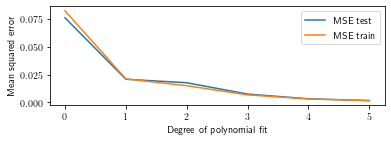

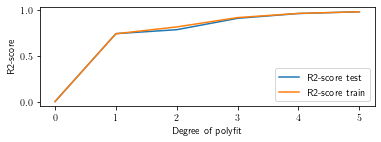

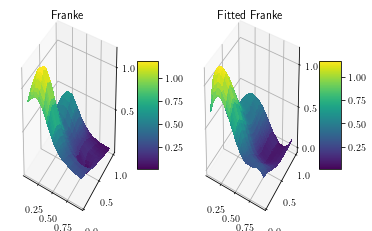

In [12]:
np.random.seed(3155)

N = 40 # The meshgrid will contain NxN points
maxdegree = 6
# Picking out N randomized (uniform distribution) values of x and y between 0 and 1
ax_row = np.random.uniform(0, 1, size=N) 
ax_col = np.random.uniform(0, 1, size=N)
# Sorting the values by value
ind_sort_row = np.argsort(ax_row)
ind_sort_col = np.argsort(ax_col)

ax_row_sorted = ax_row[ind_sort_row]
ax_col_sorted = ax_col[ind_sort_col]
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
# Creating a meshgrid of the sorted x and y-values
colmat, rowmat = np.meshgrid(ax_col_sorted, ax_row_sorted)

# Added noise to the meshgrid
noise_str = 0.0  
noise = np.random.randn(N, N)

# Calculating the value of the z-values on the meshgrid.
z = FrankeFunction(colmat, rowmat) + noise_str * noise  
#z = FrankeFunction(mx, my) + noise_str * noise
# Changing the dim of z from a meshgrid to a one-dim array. 
z = z.ravel() 

# Initiating storage vectors for calculations interesting to us
MSE_test = np.zeros(maxdegree)
MSE_train = np.zeros(maxdegree)
R2_test = np.zeros(maxdegree)
R2_train = np.zeros(maxdegree)
degrees = np.zeros(maxdegree)


for i in range(maxdegree): 
    degrees[i] = i
    X = create_X(colmat, rowmat, n=i)
    #X = create_X(mx, my, n=i)
    X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
    # Scaling
    #X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    #X_train -= X_train_mean; X_test -= X_train_mean; z_train -= z_train_mean; z_test -= z_train_mean
    # Calculating beta and variances. 
    beta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
    var_beta = np.diagonal(np.linalg.pinv(X_train.T @ X_train))
    ztilde = X_train @ beta
    zpred = X_test @ beta
    #print("Beta %1d :" % (i+1))
    #print(beta)
    #print("Variance beta %1d :" % (i+1))
    #print(var_beta)
    
    MSE_test[i] = MSE(z_test, zpred)
    MSE_train[i] = MSE(z_train, ztilde)
    R2_test[i] = R2(z_test, zpred)
    R2_train[i] = R2(z_train, ztilde)

# Printing out which polynomial degree that has the lowest MSE

print("Degree of lowest MSE: {}".format(np.argmin(MSE_test)))
print("Minimal MSE: {:e}".format(min(MSE_test)))
print("Best R2-score: {}".format(max(R2_test)))
print("Degree of best R2: {}".format(np.argmax(R2_test)))

plt.subplot(2,1,1)

plt.plot(degrees, MSE_test, label="MSE test")
plt.plot(degrees, MSE_train, label="MSE train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("Mean squared error")
plt.legend()
plt.show()

plt.subplot(2,1,2)

plt.plot(degrees, R2_test, label="R2-score test")
plt.plot(degrees, R2_train, label="R2-score train")
plt.xlabel("Degree of polyfit")
plt.ylabel("R2-score")
plt.legend()
plt.show()

zplot = X @ beta

z = z.reshape(N, N)
zplot = zplot.reshape(N, N)

fig = plt.figure()

# Plot of Franke function surface
ax = fig.add_subplot(1, 2, 1, projection='3d')
surf = ax.plot_surface(rowmat, colmat, z, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Franke')

# Plot of surface that calculated through regression
ax = fig.add_subplot(1, 2, 2, projection='3d')
surf = ax.plot_surface(rowmat, colmat, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

plt.show()

### _1.2 With noise: Scaled and non-scaled up to 42nd order polynomial_

#### 1.2.1 Scaled up to 42nd order polynomial

To see the overfitting we decided to increase the max polynomila degree without changing the number of datapoints to be able to compare it to the plot above. The results clearly indicated the overfitting after polynomial degree 20. The large MSE occuring after degree 20 correlates very well with the $R^{2}$, as it shows a smaller score after degree 20. Additionally, the smallest MSE and highest $R^{2}$ score occurs exactly on the same degree in this particular case. 

Degree of lowest MSE: 20
Minimal MSE: 3.643843e-02
Best R2-score: 0.6809225056217332
Degree of best R2: 20


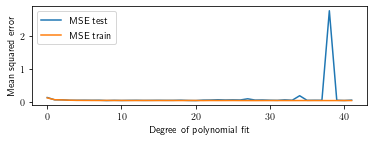

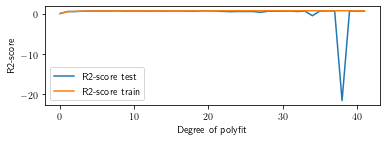

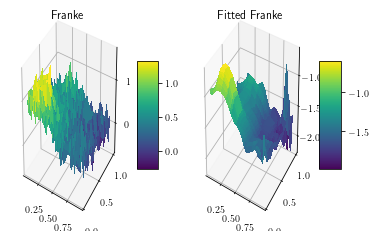

In [15]:
np.random.seed(3155)

N =  40 # The meshgrid will contain NxN points
maxdegree = 42
# Picking out N randomized (uniform distribution) values of x and y between 0 and 1
ax_row = np.random.uniform(0, 1, size=N) 
ax_col = np.random.uniform(0, 1, size=N)
# Sorting the values by value
ind_sort_row = np.argsort(ax_row)
ind_sort_col = np.argsort(ax_col)

ax_row_sorted = ax_row[ind_sort_row]
ax_col_sorted = ax_col[ind_sort_col]
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
# Creating a meshgrid of the sorted x and y-values
colmat, rowmat = np.meshgrid(ax_col_sorted, ax_row_sorted)

# Added noise to the meshgrid
noise_str = 0.2
noise = np.random.randn(N, N)

# Calculating the value of the z-values on the meshgrid.
z = FrankeFunction(colmat, rowmat) + noise_str * noise  
#z = FrankeFunction(mx, my) + noise_str * noise
# Changing the dim of z from a meshgrid to a one-dim array. 
z = z.ravel() 

# Initiating storage vectors for calculations interesting to us
MSE_test = np.zeros(maxdegree)
MSE_train = np.zeros(maxdegree)
R2_test = np.zeros(maxdegree)
R2_train = np.zeros(maxdegree)
degrees = np.zeros(maxdegree)


for i in range(maxdegree): 
    degrees[i] = i
    X = create_X(colmat, rowmat, n=i)
    #X = create_X(mx, my, n=i)
    X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
    # Scaling
    X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    X_train -= X_train_mean; X_test -= X_train_mean; z_train -= z_train_mean; z_test -= z_train_mean
    # Calculating beta and variances. 
    beta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
    var_beta = np.diagonal(np.linalg.pinv(X_train.T @ X_train))
    ztilde = X_train @ beta
    zpred = X_test @ beta
    #print("Beta %1d :" % (i+1))
    #print(beta)
    #print("Variance beta %1d :" % (i+1))
    #print(var_beta)
    
    MSE_test[i] = MSE(z_test, zpred)
    MSE_train[i] = MSE(z_train, ztilde)
    R2_test[i] = R2(z_test, zpred)
    R2_train[i] = R2(z_train, ztilde)

# Printing out which polynomial degree that has the lowest MSE

print("Degree of lowest MSE: {}".format(np.argmin(MSE_test)))
print("Minimal MSE: {:e}".format(min(MSE_test)))
print("Best R2-score: {}".format(max(R2_test)))
print("Degree of best R2: {}".format(np.argmax(R2_test)))

plt.subplot(2,1,1)

plt.plot(degrees, MSE_test, label="MSE test")
plt.plot(degrees, MSE_train, label="MSE train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("Mean squared error")
plt.legend()
plt.show()

plt.subplot(2,1,2)

plt.plot(degrees, R2_test, label="R2-score test")
plt.plot(degrees, R2_train, label="R2-score train")
plt.xlabel("Degree of polyfit")
plt.ylabel("R2-score")
plt.legend()
plt.show()

zplot = X @ beta

z = z.reshape(N, N)
zplot = zplot.reshape(N, N)

fig = plt.figure()

# Plot of Franke function surface
ax = fig.add_subplot(1, 2, 1, projection='3d')
surf = ax.plot_surface(rowmat, colmat, z, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Franke')

# Plot of surface that calculated through regression
ax = fig.add_subplot(1, 2, 2, projection='3d')
surf = ax.plot_surface(rowmat, colmat, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

plt.show()

#### 1.2.2 Not scaled up to 42nd order polynomial

We compare below the effect of scaling on the noise. Adding the noise leads to an uneven plot of MSE for training and test data as well as possible outliers, and it can be deduced after scaling that the scaling achieves smoother curves and conversely has no effect on the minimum value of MSE. 

In this case scaling should help. It will reduce the effect of outliers and help our model to fit better. Different scaling use different methods. Here we use Standard scaler which subtracts the mean of each feaure from each element of that feature in our design matrix. This will generally produce a range of data in a smaller interval. Subtracting the mean value of a particular feature enables scaling down the possible outliers or large values causing the data to represent the feature better. 

As seen in the results the minimum value of MSE and the maximum value for $R^{2}$ is the same before and after scaling, but the optimal polynomial order on the scaled data is much smaller occuring at the 9th polynomial order while the scaled data yields 20th. This gives the model more time to train the model. 

In the figures we can see that $R^{2}$ becomes more negative with increased noise and MSE become larger. 


Degree of lowest MSE: 8
Minimal MSE: 3.656991e-02
Best R2-score: 0.678878425798543
Degree of best R2: 19


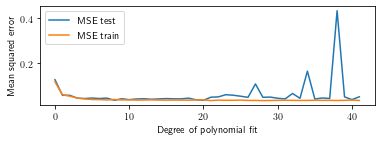

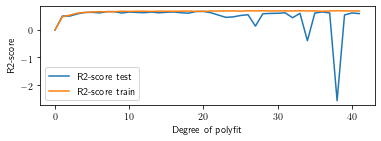

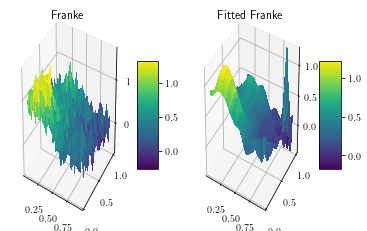

In [16]:
np.random.seed(3155)

N = 40 # The meshgrid will contain NxN points
maxdegree = 42
# Picking out N randomized (uniform distribution) values of x and y between 0 and 1
ax_row = np.random.uniform(0, 1, size=N) 
ax_col = np.random.uniform(0, 1, size=N)
# Sorting the values by value
ind_sort_row = np.argsort(ax_row)
ind_sort_col = np.argsort(ax_col)

ax_row_sorted = ax_row[ind_sort_row]
ax_col_sorted = ax_col[ind_sort_col]
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
# Creating a meshgrid of the sorted x and y-values
colmat, rowmat = np.meshgrid(ax_col_sorted, ax_row_sorted)

# Added noise to the meshgrid
noise_str = 0.2  
noise = np.random.randn(N, N)

# Calculating the value of the z-values on the meshgrid.
z = FrankeFunction(colmat, rowmat) + noise_str * noise  
#z = FrankeFunction(mx, my) + noise_str * noise
# Changing the dim of z from a meshgrid to a one-dim array. 
z = z.ravel() 

# Initiating storage vectors for calculations interesting to us
MSE_test = np.zeros(maxdegree)
MSE_train = np.zeros(maxdegree)
R2_test = np.zeros(maxdegree)
R2_train = np.zeros(maxdegree)
degrees = np.zeros(maxdegree)


for i in range(maxdegree): 
    degrees[i] = i
    X = create_X(colmat, rowmat, n=i)
    #X = create_X(mx, my, n=i)
    X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
    # Scaling
    #X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    #X_train -= X_train_mean; X_test -= X_train_mean; z_train -= z_train_mean; z_test -= z_train_mean
    # Calculating beta and variances. 
    beta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
    var_beta = np.diagonal(np.linalg.pinv(X_train.T @ X_train))
    ztilde = X_train @ beta
    zpred = X_test @ beta
    #print("Beta %1d :" % (i+1))
    #print(beta)
    #print("Variance beta %1d :" % (i+1))
    #print(var_beta)
    
    MSE_test[i] = MSE(z_test, zpred)
    MSE_train[i] = MSE(z_train, ztilde)
    R2_test[i] = R2(z_test, zpred)
    R2_train[i] = R2(z_train, ztilde)

# Printing out which polynomial degree that has the lowest MSE

print("Degree of lowest MSE: {}".format(np.argmin(MSE_test)))
print("Minimal MSE: {:e}".format(min(MSE_test)))
print("Best R2-score: {}".format(max(R2_test)))
print("Degree of best R2: {}".format(np.argmax(R2_test)))

plt.subplot(2,1,1)

plt.plot(degrees, MSE_test, label="MSE test")
plt.plot(degrees, MSE_train, label="MSE train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("Mean squared error")
plt.legend()
plt.show()

plt.subplot(2,1,2)

plt.plot(degrees, R2_test, label="R2-score test")
plt.plot(degrees, R2_train, label="R2-score train")
plt.xlabel("Degree of polyfit")
plt.ylabel("R2-score")
plt.legend()
plt.show()

zplot = X @ beta

z = z.reshape(N, N)
zplot = zplot.reshape(N, N)

fig = plt.figure()

# Plot of Franke function surface
ax = fig.add_subplot(1, 2, 1, projection='3d')
surf = ax.plot_surface(rowmat, colmat, z, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Franke')

# Plot of surface that calculated through regression
ax = fig.add_subplot(1, 2, 2, projection='3d')
surf = ax.plot_surface(rowmat, colmat, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

plt.show()

### 2. _Make own code and compare with SciKit_
Solving the system using ordinary least squares

(21,)
Fitted beta: [  0.14488668  11.11304885   4.75274018 -45.36447958 -22.57991864
 -11.52676017  60.51519225  65.26407626  28.96397015  -3.12127067
 -25.06638373 -77.75423031 -15.29207294 -37.7413325   25.48136269
  -1.4619831   29.468242    12.84373394  -2.83486073  19.85232431
 -15.53396879]
Sklearn fitted beta: [  0.14488668  11.11304885   4.7527402  -45.36447961 -22.57991863
 -11.5267603   60.51519233  65.26407622  28.96397014  -3.12127033
 -25.06638382 -77.75423028 -15.29207289 -37.74133252  25.48136232
  -1.46198306  29.468242    12.84373392  -2.83486074  19.85232433
 -15.53396865]
MSE with intercept column
0.0017123048784877001
MSE with intercept column from SKL
0.0017123048776991649
Fitted beta: [  0.          11.11304885   4.75274019 -45.36447958 -22.57991862
 -11.52676028  60.51519225  65.26407623  28.96397013  -3.12127039
 -25.06638373 -77.75423029 -15.29207289 -37.7413325   25.48136238
  -1.46198309  29.468242    12.84373393  -2.83486074  19.85232433
 -15.53396867]
Sklea

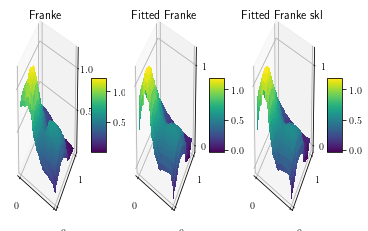

In [17]:
np.random.seed(3155)

# Initiating values of x, y, z and design matrix X
N = 100
#Ny = 100
n = 5
x = np.random.uniform(0, 1, N)
y = np.random.uniform(0, 1, N)
ind_x_sorted = np.argsort(x)
ind_y_sorted = np.argsort(y)
x_sorted = x[ind_x_sorted]
y_sorted = y[ind_y_sorted]
mx, my = np.meshgrid(x_sorted, y_sorted)

noise = 0.0*np.random.randn(N, N)
ax_row = np.random.uniform(0, 1, N)
ax_col = np.random.uniform(0, 1, N)
ind_sort_row = np.argsort(ax_row)
ind_sort_col = np.argsort(ax_col)
ax_row_sorted = ax_row[ind_sort_row]
ax_col_sorted = ax_col[ind_sort_col]
colmat, rowmat = np.meshgrid(ax_col_sorted, ax_row_sorted)
z = FrankeFunction(mx, my) + noise
#z = FrankeFunction(colmat, rowmat) #+ noise
z = z.ravel()
X = create_X(mx, my, n=n)
#X = create_X(colmat, rowmat, n=n)
# Split into train and test sets
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)

# Fitting function
olsbetafull = OLS_beta(X, z) 
olsbeta = OLS_beta(X_train, z_train)
skl = LinearRegression(fit_intercept=False).fit(X_train, z_train)

# Prints properties of OLS beta using own code and skl (unscaled)
print(olsbeta.shape)
print(f"Fitted beta: {olsbeta}")
#print(f"FUll-train: {olsbetafull-olsbeta}")
print(f"Sklearn fitted beta: {skl.coef_}")
zpredictOwn = X_test @ olsbeta
zpredictSKL = skl.predict(X_test)
zplotskl = skl.predict(X) # Makes plot of skl fit
zplot = X @ olsbeta # Makes plot of fit using own code
print(f"MSE with intercept column")
print(MSE(z_test,zpredictOwn))
#print(f"R2 with intercept column")
#print(R2(z_test, zpredictOwn))
print(f"MSE with intercept column from SKL")
print(MSE(z_test,zpredictSKL))
#print(f"R2 with intercept column from SKL")
#print(R2(z_test, zpredictSKL))
#print(np.linalg.pinv(X_train.T @ X_train))
#print(1/N*np.diagonal(np.linalg.inv(X_train.T @ X_train)))
varBeta = 1/N*np.linalg.pinv(X.T @ X)
#for i in range(21): 
 #   print(f'Variance of Beta %1d'% i )
  #  print(varBeta[i,i])
# Same calculations as above, only scaling first
skl = LinearRegression(fit_intercept=True).fit(X_train, z_train)

# Use centered values for X and y when computing coefficients
z_offset = np.average(z_train, axis=0)
X_offset = np.average(X_train, axis=0)

olsbeta = OLS_beta(X_train-X_offset, z_train-z_offset) # Scaled 
print(f"Fitted beta: {olsbeta}")
print(f"Sklearn fitted beta: {skl.coef_}")
zpredictOwn = (X_test-X_offset) @ olsbeta
zpredictSKL = skl.predict(X_test)
print(f"MSE without intercept column")
print(MSE(z_test-z_offset,zpredictOwn))
print(f"R2 without intercept column")
print(R2(z_test-z_offset, zpredictOwn))
print(f"MSE without intercept column from SKL")
print(MSE(z_test,zpredictSKL))
print(f"R2 without intercept column from SKL")
print(R2(z_test, zpredictSKL))
z = z.reshape(N, N)
zplot = zplot.reshape(N, N) # Reshaping plots
zplotskl = zplotskl.reshape(N, N) 
fig = plt.figure()

# Plots Franke function on the meshgrid
ax = fig.add_subplot(1, 3, 1, projection='3d')
surf = ax.plot_surface(colmat, rowmat, z, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Franke')

# Plots regression fit using own code on the meshgrid
ax = fig.add_subplot(1, 3, 2, projection='3d')
surf = ax.plot_surface(colmat, rowmat, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

# Plots regression fit using skl code on the meshgrid
ax = fig.add_subplot(1, 3, 3, projection='3d')
surf = ax.plot_surface(colmat, rowmat, zplotskl, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke skl')

plt.show()

### 3. _Calculating confidence intervals in beta values using the best polynomial (n=5, for N=100)_

The same process for OLS is repeated above, except for n = 5 and N=100, using the analytical expression for the variance and calculating the 95% confidence interval for the beta parameters. A 95% confidence interval indicates that the true mean value for beta lies within the interval and with estimation of such an interval one can be 95% confident that the value generated using this model will be in this interval. The general trend is that with beta parameters higher than three show larger confidence intervals, and larger beta parametersare often associated with higher variance which will increase the confidence interval. 


Beta values for OLS:
[  0.11679473  11.36366696   4.97145711 -46.43841293 -23.20826982
 -12.34921453  62.48144498  66.99612146  29.4993459   -1.50484246
 -26.76620476 -79.36890828 -16.47421551 -37.78664719  23.95401492
  -0.87914542  29.90387706  13.46769121  -2.6326101   19.78611372
 -14.99486246]
MSE test for n=5: 1.828953e-03
R2 test for n=5: 0.9796633184759855
MSE train for n=5: 1.793668e-03
R2 train n=5: 0.9802742932136118


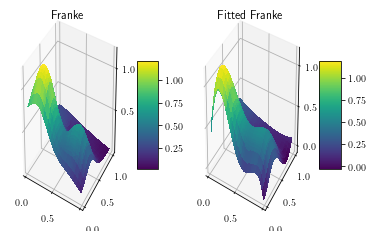

Confidence intervals of beta, in order


[(-0.3199921428320178, 0.5535815962302539),
 (6.416606759029133, 16.310727152067027),
 (0.9410007648177672, 9.001913457461086),
 (-69.73297817687398, -23.143847684830625),
 (-40.5341732190505, -5.882366422091508),
 (-30.720500591581725, 6.022071528911395),
 (10.183332086198234, 114.77955788128595),
 (28.3682930634714, 105.62394984855554),
 (-4.34682454613618, 63.34551633882333),
 (-42.409635629498545, 39.39995070398408),
 (-81.89274767207735, 28.36033815755375),
 (-120.39026167615656, -38.347554890176426),
 (-53.92178657938791, 20.973355552882495),
 (-73.08464558501987, -2.4886487876777252),
 (-18.902906642683618, 66.81093648325404),
 (-22.716195430223564, 20.957904580292222),
 (11.752211311767638, 48.05554280974067),
 (-5.495632531849033, 32.43101496072915),
 (-19.1179633743235, 13.85274318067385),
 (4.069317040757493, 35.502910399279386),
 (-31.919295015621195, 1.9295701026272614)]

In [18]:
np.random.seed(3155)

# Initiating the meshgrid, design matrix and function values on the grid
# Setting n = 5, because the best polynomial fit for N=100 was for degree 5
n = 5
N = 100
x = np.random.uniform(0, 1, N)
y = np.random.uniform(0, 1, N)
ind_x_sort = np.argsort(x)
ind_y_sort = np.argsort(y)
x_sorted = x[ind_x_sort]
y_sorted = y[ind_y_sort]
#x = np.sort(x)
#y = np.sort(y)
mx, my = np.meshgrid(x_sorted, y_sorted)

z = FrankeFunction(mx, my)
X = create_X(mx, my, n)
z = z.ravel()

# Splits dataset into test and train
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)

# Scaling dataset by subtracting mean
#X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
#X_train = X_train - X_train_mean; X_test = X_test - X_train_mean
#z_train = z_train - z_train_mean; z_test = z_test - z_train_mean

ols = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
print("Beta values for OLS:")
print(ols)

zpred = X_test @ ols
ztilde = X_train @ ols
zplot = X @ ols

MSETest = MSE(z_test, zpred)
MSETrain = MSE(z_train, ztilde)
R2Test = R2(z_test, zpred)
R2Train = R2(z_train, ztilde)
zplot = zplot.reshape(N, N)
print("MSE test for n={}: {:e}".format(n, MSETest))
print("R2 test for n={}: {}".format(n, R2Test))
print("MSE train for n={}: {:e}".format(n, MSETrain))
print("R2 train n={}: {}".format(n, R2Train))

fig = plt.figure()
ax = fig.add_subplot(1, 2, 1, projection="3d")
surf = ax.plot_surface(mx, my, z.reshape(N,N), cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title("Franke")

ax = fig.add_subplot(1, 2, 2, projection="3d") 
surf = ax.plot_surface(mx, my, zplot, cmap=cm.viridis, linewidth=0, antialiased=False)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Fitted Franke')

plt.show()
# Calculating variance of the OLS estimator
var_beta = np.diagonal(np.linalg.pinv(X.T @ X))

r = confidence_interval(var_beta, 1.96, ols)
# Printing confidence intervals of the beta values
print("Confidence intervals of beta, in order")
r

#### Confidence Intervals of Beta

<table>
<thead>
<tr>
<th>Beta index</th>
<th>Confidence interval[95%]</th>
</tr>
</thead>
<tbody>
<tr>
<td>0</td>
<td>[-0.32, 0.55]</td>
</tr>
<tr>
<td>1</td>
<td>[6.42, 16.31</td>
</tr>
<tr>
<td>2</td>
<td>[0.94, 9.00]</td>
</tr>
<tr>
<td>3</td>
<td>[-69.73, -23.14</td>
</tr>
<tr>
<td>4</td>
<td>[-40.53, -5.88]</td>
</tr>
<tr>
<td>5</td>
<td>[-30.72, 6.02]</td>
</tr>
<tr>
<td>6</td>
<td>[10.18, 114.78]</td>
</tr>
<tr>
<td>7</td>
<td>[28.37, 105.62]</td>
</tr>
<tr>
<td>8</td>
<td>[-4.35, 63.35]</td>
</tr> 
<tr>
<td>9</td>
<td>[-42.41, 39.40]</td>
</tr>
<tr>
<td>10</td>
<td>[-81.89, 28.36]</td>
</tr>
<tr>
<td>11</td>
<td>[-120.39, -38.35]</td>
</tr>
<tr>
<td>12</td>
<td>[-53.92, 20.97]</td>
</tr>
<tr>
<td>13</td>
<td>[-73.08, -2.49]</td>
</tr>
<tr>
<td>14</td>
<td>[-18.90, 66.81]</td>
</tr>
<tr>
<td>15</td>
<td>[-22.72, 20.96]</td>
</tr>
<tr>
<td>16</td>
<td>[11.75, 48.06]</td>
</tr>
<tr>
<td>17</td>
<td>[-5.50, 32.43]</td>
</tr>
<tr>
<td>18</td>
<td>[-19.12, 13.85]</td>
</tr>
<tr>
<td>19</td>
<td>[4.07, 35.50]</td>
</tr>
<tr>
<td>20</td>
<td>[-31.92, 1.93]</td>
</tr>
</tbody>
</table>

## EXERCISE 2

### _1. HASTIE_

The analytical expression for OLS is used and it yields a plot somewhat similiar to Hastie. The results show that we expect to see the possible bias-variance optimum at around 38th polynomial degree, if we are to observe overfitting. The same number of data points and maximum degree cannot unfortunately be applied for the bias-variance analysis due to improper results (the reason is attributed to the number of data points and is discussed later). 

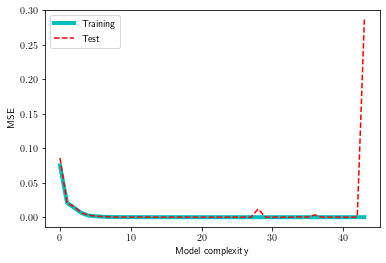

polynomial degree with smallest MSE:  38


In [31]:
np.random.seed(3155)

# running MSE-check for polynomials of degree up to max_degree
max_degree = 44

# setting up MSE train and test vectors
MSE_train = np.zeros(max_degree)
MSE_test = np.zeros(max_degree)
# R2 vectors
R2_train = np.zeros(max_degree)
R2_test = np.zeros(max_degree)
# order of polynomial
polynomial = np.zeros(max_degree)


N = 30

x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)

# creating dataset
z = FrankeFunction(mx, my)
z_arr = z.ravel()


for i in range(max_degree):
    polynomial[i] = i
    # creating design matrix for a poly of degree i
    X = create_X(mx, my, n=i)
    
    #splitting data into train and test sets
    X_train, X_test, z_train, z_test = train_test_split(X,z_arr,test_size=0.2)
    
    # no need to scale the data as we have a "clean dataset"
    X_train_mean = np.mean(X_train, axis=0); z_train_mean = np.mean(z_train, axis=0)
    X_train = X_train - X_train_mean; X_test = X_test - X_train_mean
    z_train = z_train - z_train_mean; z_test = z_test - z_train_mean
    #OLS fit for training data
    #skl = LinearRegression(fit_intercept=True)
    #olsfit = skl.fit(X_train, z_train)
    #olsz_train = olsfit.predict(X_train); 
    
    #R2_train[i] = r2_score(z_train, olsz_train)
    beta = OLS_beta(X_train, z_train)
    zpred = X_test @ beta
    ztilde = X_train @ beta
    #OLS fit for test data
    #olsz_test = olsfit.predict(X_test)
    MSE_test[i] = mean_squared_error(z_test,zpred)
    MSE_train[i] = mean_squared_error(z_train, ztilde)
    #R2_test[i] = r2_score(z_test,olsz_test)
    
plt.figure()
plt.plot(polynomial,MSE_train, 'c-', linewidth=4, label="Training")
plt.plot(polynomial, MSE_test, 'r--', label="Test")
plt.xlabel('Model complexity')
plt.ylabel('MSE')

plt.legend(); plt.show()

print('polynomial degree with smallest MSE: ', np.argmin(MSE_test))

### 2. _Bias-Variance tradeoff_

##### Theory behind Bias-Variance tradeoff

Bias-variance analysis utilizes the bootstrap method to calculate MSE for training and test data, allowing us to make a reliable prediction on MSE test value. The _bias_ measures the deviation of the mean value of the predicted values from the corresponding data points and therefore measures the degree of dissimilarity in behaviour between model and data. Because the model is usually too simple to fit the data properly in the beginning, generating a large difference between the model and the data, high bias is expected in this region; and as the model complexity increases the bias is also expected to decrease as the model improves the fitting of the training data. The _variance_ term represents the variance in the model itself (the variance of the predicted mean values) and increases with model complexity during which overfitting starts to occur. In a bias-variance analysis the ideal scenario is a balance between bias and variance (low bias and low variance) to determine the optimal degree. Three other situations may also appear, all of which are non-ideal: 1) high bias and low variance; 2) low bias and high variance; and 3) high bias and high variance. Lastly, the _error_ term is the normally distributed noise in the model. 

##### Rewriting the cost function ####

$$
C(\textbf{X},\beta) = \frac{1}{n}\sum_{i=0}^{n-1}
\, (y_{i}-\widetilde{y}_{i})^{2} = \mathbb{E}\left[(\textbf{y}-\widetilde{\textbf{y}})^{2} \right]
= \mathbb{E}\left[(\;\overbrace{ \color{red} {(f\, +  \epsilon ) } }^{y} -\widetilde{\textbf{y}})^{2} \right] 
$$

$$
= \mathbb{E}\left[(\; 
(f\, + \bf{ \epsilon })  \overbrace{ \color{red}{ \, -\mathbb{E(\widetilde{\bf y})} + \mathbb{E(\widetilde{\bf y} })} }^{Expansion} -\widetilde{\textbf{y}})^{2} \right] 
= \mathbb{E}\left[\;  (  \;  \underbrace{  [f  -\mathbb{E(\widetilde{\bf y})}   ] } \; \underbrace{-   [\widetilde{\textbf{y}} - \mathbb{E(\widetilde{\bf y})}] }+\underbrace{ \epsilon })^{2} \right]
$$

$$
= \mathbb{E}\left[\; \underbrace { ( f  -\mathbb{E(\widetilde{\bf y})}  \, ) ^{2} } + \, \underbrace {(\,\widetilde{\textbf{y}} - \mathbb{E(\widetilde{\bf y})\,})^{2} }
+\, \underbrace { \epsilon^{2} }\; \underbrace {- \,  2 \,(  f  -\mathbb{E(\widetilde{\bf y})}  \, )\;
(\, \widetilde{\bf y}\, -  \mathbb{E(\widetilde{\bf y})} \,) }
\, + \, \underbrace { 2 \, (  f  -\mathbb{E(\widetilde{\bf y})}  \, )\; \epsilon }
\; \;  \underbrace {  - \,  2 \, (\, \widetilde{\bf y}\, -  \mathbb{E(\widetilde{\bf y})} \, )\; \epsilon } \,  \right]
$$

$$
= \mathbb{E} ( f  -\mathbb{E(\widetilde{\bf y})}  \, ) ^{2}
+ \mathbb{E}(\,\widetilde{\textbf{y}} - \mathbb{E(\widetilde{\bf y})\,})^{2} +  \overbrace { \mathbb{E}(\epsilon^{2}) }^{= \, \sigma^{2}} \; - \,    2 \, \mathbb{E}(  \;f  -\mathbb{E(\widetilde{\bf y})}  \, \; )\;  \;
 ( \overbrace { \mathbb{E(\widetilde{\bf y})} \, - \underbrace { \mathbb{E(\mathbb{E(\widetilde{\bf y})})}\, }_{\mathbb{E (\widetilde{\bf y})}} \, }^{= \, 0})  \, +\,  \mathbb{E} \left[ 2 \, (  f  -\mathbb{E(\widetilde{\bf y})}  \, ) \right]  \, \overbrace { \mathbb{E}(\epsilon) }^{= \, 0} 
\; 
$$

$$
+ \, 2 \, \mathbb{E}(  \;f  -\mathbb{E(\widetilde{\bf y})}  \, \; )\;   \overbrace { \mathbb{E}(\epsilon) }^{=\, 0 }
 - \; 2 \, ( \,    \overbrace { \mathbb{E(\widetilde{\bf y})} \, - \underbrace { \mathbb{E(\mathbb{E(\widetilde{\bf y})})}\, }_{\mathbb{E (\widetilde{\bf y})}} }^{= \, 0} \,
)\; \overbrace {\mathbb{E}(\epsilon)}^{= \, 0}
$$

$$
= \mathbb{E} ( f  -\mathbb{E(\widetilde{\bf y})}  \, ) ^{2}
+ \mathbb{E}(\,\widetilde{\textbf{y}} - \mathbb{E(\widetilde{\bf y})\,})^{2} +  \sigma^{2} 
= \underbrace { \frac{1}{n}\sum_i^{}( f_i  -\mathbb{E(\widetilde{\bf y})}  \, ) ^{2} }_{bias} + \underbrace { \frac{1}{n}\sum_i^{}(\,\widetilde{y_i} - \mathbb{E(\widetilde{\bf y})\,})^{2} }_{variance} +  \underbrace { \sigma^{2} }_{error}
$$

##### Computing the BV-tradeoff against degree of polynomial fit

With datapoints lower than 50 the bias suddenly increases after a certain degree at around the same time as the variance and the MSE test error. MSE test error after a sudden increase decreases back making it difficult to spot overfitting which coincides with the variance and bias. The region where the bias, variance and error are reaching a maximum are regions indicating high bias and high variance, the least desirable model. 

Above 50 datapoints the bias appears normal; it decreases with complexity; as well as the error, though it indicates no overfitting due to the high number of data points. The variance, however, continues to stay at large values for all polynomials. Overall, the situation is low bias and high variance. 

In our case the optimal number of data points is 50, but it can change with different number of bootstraps (number of bootstraps must not ideally exceed number of data points) and different max degrees. 

#### _2.1 Optimal bias-variance analysis_:

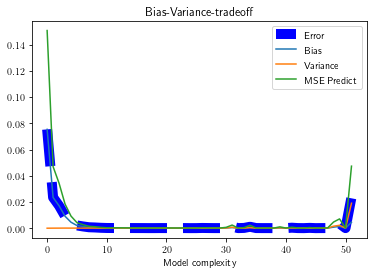

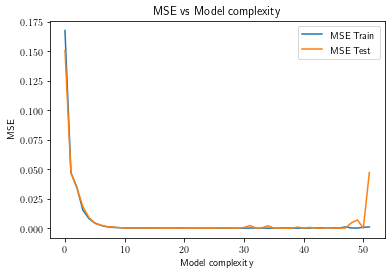

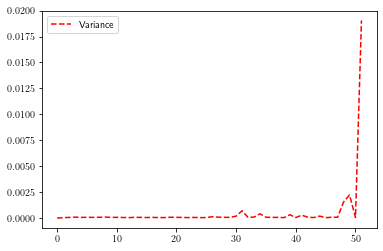

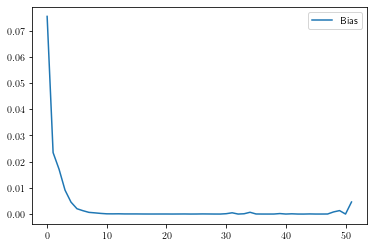

polynomial degree with smallest MSE:  43
best MSE:  0.00011149619642571591


In [35]:
np.random.seed(3155)
# Setting up a NxN meshgrid, calculating z for all points, making z one-dimensional
N = 50
maxdegree = 52
n_bootstraps = 20
x = np.linspace(0, 1, N)
y = np.linspace(0, 1, N)
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) #+ 0.1*np.random.randn(Ny, Nx)
z_arr = z.ravel()

# Setting up arrays of length maxdegree to store values used 
# to demonstrate bias-variance tradeoff
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
# Setting up similar arrays for train values
error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree);

# setting up design matrix, splitting data into train and test
for degree in range(maxdegree): 
    X = create_X(mx, my, n=degree)
    X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
    # scaling z
    z_offset = np.average(z_train, axis=0)
    z_train = z_train - z_offset
    z_test = z_test - z_offset
    # setting up empty arrays that can store the values for 
    # different bootstrap resampled predictions
    zpred = np.empty((z_test.shape[0], n_bootstraps))
    ztrain = np.empty((z_train.shape[0], n_bootstraps))
    # running bootstrap
    for i in range(n_bootstraps): 
        # resampling
        x_, z_ = resample(X_train, z_train)
        # scaling resampled design
        x_offset = np.average(x_, axis=0)
        # calculating beta
        olsbeta = OLS_beta(x_-x_offset, z_)
        # calculating prediction based on x_ and z_ training set
        zpred[:, i] = (X_test-x_offset) @ olsbeta
        ztrain[:, i] = (X_train-x_offset) @ olsbeta
    
    # Storing values in appropriate vector
    polydegree[degree] = degree
    error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
    
    error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
    bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
    variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
    MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]

    
# Plotting error, bias, variance and MSE_predict against polynomial order
plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
plt.plot(polydegree, bias, label='Bias')
plt.plot(polydegree, variance, label='Variance')
plt.plot(polydegree, MSE_predict, label='MSE Predict')
plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff')
#plt.xlim(0, 15); plt.ylim(0, 0.009)
save_fig('BiasVarTradeOLS')
plt.legend(); plt.show()

plt.figure()
plt.plot(polydegree, MSE_Train,label='MSE Train'); 
plt.plot(polydegree, MSE_predict, label="MSE Test")
plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeOLS'); plt.show()
plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeOLS'); plt.show()
print('polynomial degree with smallest MSE: ', np.argmin(MSE_predict))
print('best MSE: ', MSE_predict[np.argmin(MSE_predict)])

#### _2.2 N<50 bias-variance analysis_:

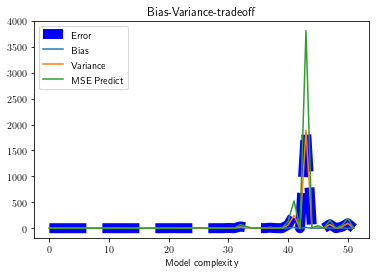

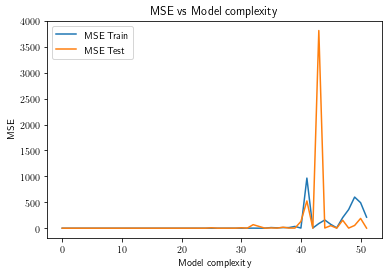

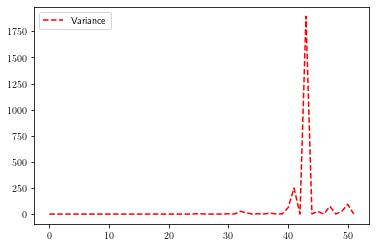

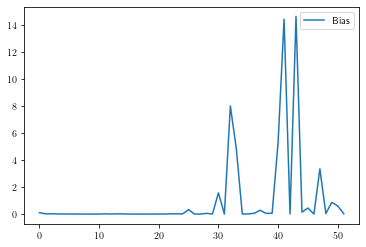

polynomial degree with smallest MSE:  10


In [37]:
np.random.seed(3155)
# Setting up a NxN meshgrid, calculating z for all points, making z one-dimensional
N = 20
maxdegree = 52
n_bootstraps = 20
x = np.linspace(0, 1, N)
y = np.linspace(0, 1, N)
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) #+ 0.1*np.random.randn(Ny, Nx)
z_arr = z.ravel()

# Setting up arrays of length maxdegree to store values used 
# to demonstrate bias-variance tradeoff
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
# Setting up similar arrays for train values
error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree);

# setting up design matrix, splitting data into train and test
for degree in range(maxdegree): 
    X = create_X(mx, my, n=degree)
    X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
    # scaling z
    z_offset = np.average(z_train, axis=0)
    z_train = z_train - z_offset
    z_test = z_test - z_offset
    # setting up empty arrays that can store the values for 
    # different bootstrap resampled predictions
    zpred = np.empty((z_test.shape[0], n_bootstraps))
    ztrain = np.empty((z_train.shape[0], n_bootstraps))
    # running bootstrap
    for i in range(n_bootstraps): 
        # resampling
        x_, z_ = resample(X_train, z_train)
        # scaling resampled design
        x_offset = np.average(x_, axis=0)
        # calculating beta
        olsbeta = OLS_beta(x_-x_offset, z_)
        # calculating prediction based on x_ and z_ training set
        zpred[:, i] = (X_test-x_offset) @ olsbeta
        ztrain[:, i] = (X_train-x_offset) @ olsbeta
    
    # Storing values in appropriate vector
    polydegree[degree] = degree
    error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
    
    error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
    bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
    variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
    MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]

    
# Plotting error, bias, variance and MSE_predict against polynomial order
plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
plt.plot(polydegree, bias, label='Bias')
plt.plot(polydegree, variance, label='Variance')
plt.plot(polydegree, MSE_predict, label='MSE Predict')
plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff')
#plt.xlim(0, 15); plt.ylim(0, 0.009)
save_fig('BiasVarTradeOLS')
plt.legend(); plt.show()

plt.figure()
plt.plot(polydegree, MSE_Train,label='MSE Train'); 
plt.plot(polydegree, MSE_predict, label="MSE Test")
plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeOLS'); plt.show()
plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeOLS'); plt.show()
print('polynomial degree with smallest MSE: ', np.argmin(MSE_predict))

#### _2.3 N>50 bias-variance analysis_:

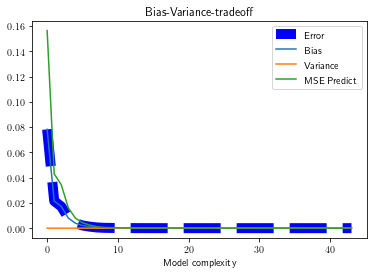

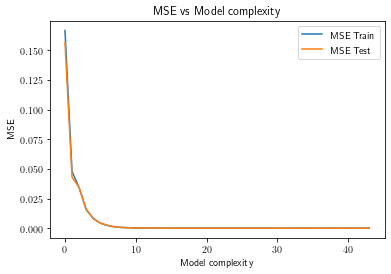

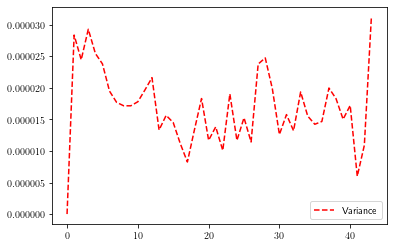

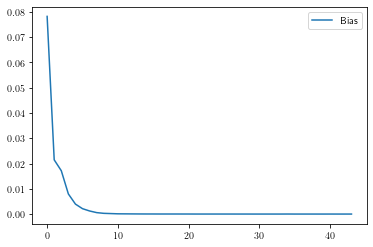

polynomial degree with smallest MSE:  41


In [34]:
np.random.seed(3155)
# Setting up a NxN meshgrid, calculating z for all points, making z one-dimensional
N = 80
maxdegree = 44
n_bootstraps = 20
x = np.linspace(0, 1, N)
y = np.linspace(0, 1, N)
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) #+ 0.1*np.random.randn(Ny, Nx)
z_arr = z.ravel()

# Setting up arrays of length maxdegree to store values used 
# to demonstrate bias-variance tradeoff
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
# Setting up similar arrays for train values
error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree);

# setting up design matrix, splitting data into train and test
for degree in range(maxdegree): 
    X = create_X(mx, my, n=degree)
    X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
    # scaling z
    z_offset = np.average(z_train, axis=0)
    z_train = z_train - z_offset
    z_test = z_test - z_offset
    # setting up empty arrays that can store the values for 
    # different bootstrap resampled predictions
    zpred = np.empty((z_test.shape[0], n_bootstraps))
    ztrain = np.empty((z_train.shape[0], n_bootstraps))
    # running bootstrap
    for i in range(n_bootstraps): 
        # resampling
        x_, z_ = resample(X_train, z_train)
        # scaling resampled design
        x_offset = np.average(x_, axis=0)
        # calculating beta
        olsbeta = OLS_beta(x_-x_offset, z_)
        # calculating prediction based on x_ and z_ training set
        zpred[:, i] = (X_test-x_offset) @ olsbeta
        ztrain[:, i] = (X_train-x_offset) @ olsbeta
    
    # Storing values in appropriate vector
    polydegree[degree] = degree
    error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
    
    error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
    bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
    variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
    MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]

    
# Plotting error, bias, variance and MSE_predict against polynomial order
plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
plt.plot(polydegree, bias, label='Bias')
plt.plot(polydegree, variance, label='Variance')
plt.plot(polydegree, MSE_predict, label='MSE Predict')
plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff')
#plt.xlim(0, 15); plt.ylim(0, 0.009)
save_fig('BiasVarTradeOLS')
plt.legend(); plt.show()

plt.figure()
plt.plot(polydegree, MSE_Train,label='MSE Train'); 
plt.plot(polydegree, MSE_predict, label="MSE Test")
plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeOLS'); plt.show()
plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeOLS'); plt.show()
print('polynomial degree with smallest MSE: ', np.argmin(MSE_predict))

#### 3. _Hastie vs Bias-Variance tradeoff_####

OLS yields optimal degree 38 which is not far from the one estimated using bias-variance analysis at 43. The Hastie figure appears to be unreliable since running different number of data points and max degree gave us different, inconsistent answers, but also because bias-variance analysis implements boostrap method a particular number of times in order to determine a more reliable model. 

## EXERCISE 3
### _Cross-validation resampling technique_

_crossvalidation_ols(k)_ function takes in k and splits the indices of data points into k units. It also makes sure to split the data such that any odd data points left out become part of the correct units. i is used to count the number of times the for loop is running and enables the insertion of estimated values into the KFold scores arrays. Everytime the for loops runs it makes the kth fold the test data and assigns the test data index from concact_pre, which contains all the indices for split data. Then it proceeds to check the length of concat; if it has only one fold left or more. If there is one left, it uses the index in concat to assign this as training data. This is relevant when k = 2. The other option is when k > 2; it concatanates the remaining data as a whole training data. 

After the if statement it applies the generated test data indexes and train data indexes in order to generate the test and training data. Thereafter SciKit OLS and analytical expression for OLS are applied for comparison and the KFold scores are calculated. After the code exits the for loop it takes the mean value of the scores to yield the MSE values. Lastly, SciKit's cross validation function is also implemented for further comparison. The results show a dramatic deviation from SciKit's function.

In [ ]:
np.random.seed(3155)

# Setting up meshgrids of input and output
# create design matrix, make z one-dimensional.
n = 5
N = 100
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z = z.ravel()
X = create_X(mx, my, n=n)

# Cross validation OLS
def crossvalidation_ols(k):
    
    # Array that can store value of MSE for 
    # all k.
    scores_scikit_KFold = np.zeros((1,k)) 
    scores_KFold = np.zeros((1,k))
     
    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))

    i = 0
    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
               train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]]))
       
        xtrain = X[train_inds]
        ztrain = z[train_inds]

        xtest = X[test_inds]
        ztest = z[test_inds]
        
        #Scaled, SciKit:
        olsfit = skl.LinearRegression().fit(xtrain, ztrain)
        olsz_test = olsfit.predict(xtest)
        scores_scikit_KFold[0][i] = np.sum((olsz_test - ztest)**2)/np.size(olsz_test)
        
        #Scaled, OLS:
        xtrain_mean = np.mean(xtrain, axis=0); ztrain_mean = np.mean(ztrain, axis=0)
        xtrain = xtrain-xtrain_mean; xtest = xtest - xtrain_mean
        ztrain = ztrain-ztrain_mean; ztest = ztest - ztrain_mean
        beta = np.linalg.pinv(xtrain.T @ xtrain) @ xtrain.T @ ztrain      
        # and then make the prediction
        ztilde = xtrain @ beta
        zpredict = xtest @ beta
        scores_KFold[0][i] = np.sum((zpredict - ztest)**2)/np.size(zpredict)

        i += 1 

    estimated_sci_mse_KFold = np.mean(scores_scikit_KFold)
    estimated_mse_KFold = np.mean(scores_KFold)
    
    return estimated_sci_mse_KFold, estimated_mse_KFold

#SciKit's cross validation:
def crossvalidation_scikit(k):
    kfold = KFold(n_splits = k) 
    olsfit = skl.LinearRegression()
    estimated_mse_folds = cross_val_score(olsfit, X, z[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

#Printing cross validation
print('k: \t cross validation ols scikit \t cross validation ols (analytical) \t cross validation scikit')
for k in range(5,10+1):
          print(k,'\t',crossvalidation_ols(k)[0],'\t\t', crossvalidation_ols(k)[1], '\t\t\t', crossvalidation_scikit(k))

## EXERCISE 4
### Ridge regression, using own code

Training MSE for OLS
0.0017936682814049818
MSE predict OLS
0.0018289527766152823
R2 score OLS
0.9796633184700279
Lambda value which gives minimal MSE
4.328761281083062e-05
Min value of MSE predict for Ridge
0.0018208204269691561
R2 score connected to min MSE Ridge
0.9797537445362217


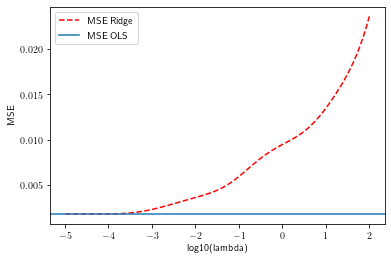

In [11]:
np.random.seed(3155)
from sklearn.model_selection import GridSearchCV

# Setting up a meshgrid of input and output
N = 100
n = 5
x = np.sort(np.random.uniform(0,1,N)) 
y = np.sort(np.random.uniform(0,1,N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) #+ np.random.randn(N)
# Making z one-dimensional, creating design matrix
z = z.ravel()
X = create_X(mx,my, n=n)
# Splitting data into train and test sets
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)



# matrix inversion to find beta
OLSbeta = np.linalg.pinv(np.transpose(X_train) @ X_train) @ np.transpose(X_train) @ z_train
# and then make the prediction
ztildeOLS = X_train @ OLSbeta
print("Training MSE for OLS")
print(MSE(z_train,ztildeOLS))

zpredictOLS = X_test @ OLSbeta
print("MSE predict OLS")
print(MSE(z_test, zpredictOLS))
print("R2 score OLS")
print(R2(z_test, zpredictOLS))


# Repeat now for Ridge regression and various values of the regularization parameter
I = np.eye(len(OLSbeta), len(OLSbeta))
# Decide which values of lambda to use
nlambdas = 100
MSEPredict = np.zeros(nlambdas)
R2Ridge = np.zeros(nlambdas)
# Interval of lambda in logspace
lambdas = np.logspace(-5, 2, nlambdas) 
# Iterating through a nlambdas values of lambda
# calculating MSE and R2 of Ridgepredict
for i in range(nlambdas):
    lmb = lambdas[i]
    Ridgebeta = np.linalg.inv(np.transpose(X_train) @ X_train+lmb*I) @ np.transpose(X_train) @ z_train
    # and then make the prediction
    zpredictRidge = X_test @ Ridgebeta
    MSEPredict[i] = MSE(z_test,zpredictRidge)
    R2Ridge[i] = R2(z_test, zpredictRidge)
#    print(MSEPredict[i])
# Now plot the results
minima = MSEPredict[0]
l = 0
for i in range(len(MSEPredict)): 
    if (MSEPredict[i]< minima): 
        l = i
        minima = MSEPredict[i]
print("Lambda value which gives minimal MSE")
print(lambdas[l])
print("Min value of MSE predict for Ridge")
print(MSEPredict[l])
print("R2 score connected to min MSE Ridge")
print(R2Ridge[l])
    
plt.figure()
plt.plot(np.log10(lambdas), MSEPredict, 'r--', label = 'MSE Ridge')
plt.axhline(MSE(z_test, zpredictOLS), label = 'MSE OLS')
plt.xlabel('log10(lambda)')
plt.ylabel('MSE')
plt.legend()
plt.show()

#grid = GridSearchCV(Ridgebeta, param_grid=dict(alpha=lambdas), refit = True, verbose = 3,n_jobs=-1) 
#print(grid) 
#grid.fit(X_test, z_test) 
#print('best score') 
#print(grid.best_score_) 
#print('best estimator') 
#print(grid.best_estimator_.alpha)


### Bootstrap analysis of Ridge 

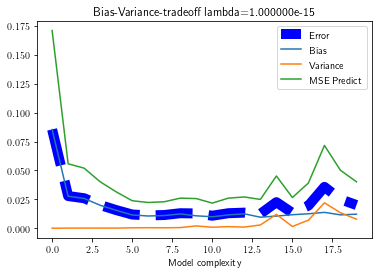

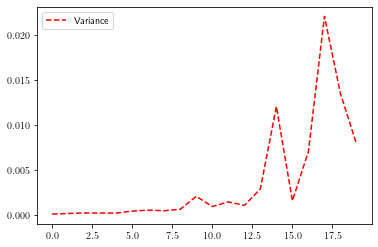

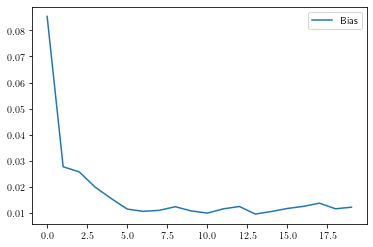

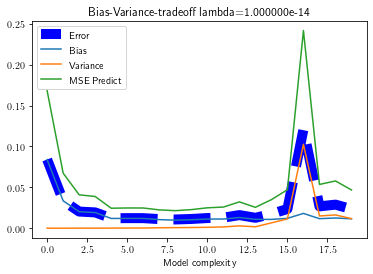

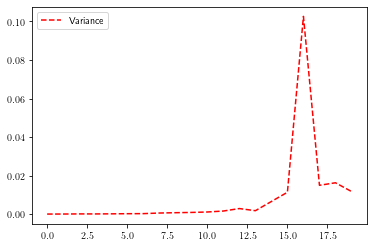

...

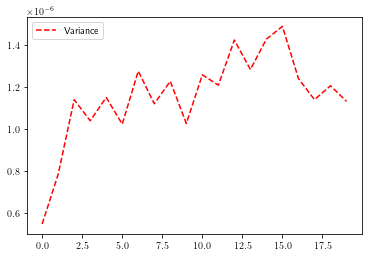

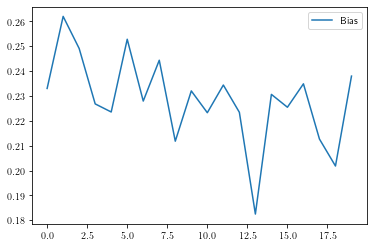

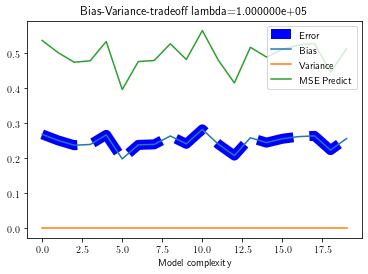

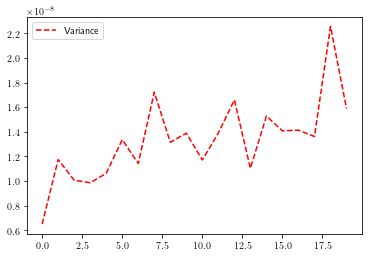

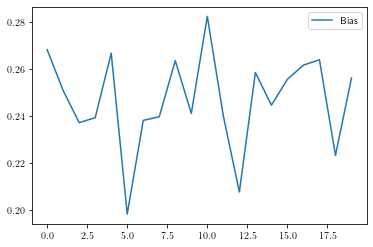

Best R2: 0.8777741112024953, std: 0.006536959537957135
Lowest MSE: 8.829294e-03, std: 4.722137e-04


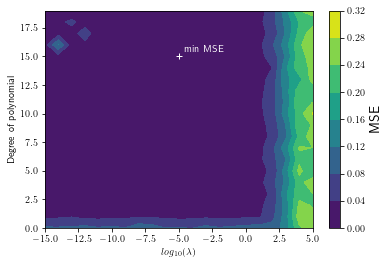

In [7]:
np.random.seed(3155)

# Using optimal lambda from code above
nlambdas = 21; lambdas = np.logspace(-15, 5, nlambdas)
# Setting up meshgrid of data
N = 32
maxdegree = 20 # maximal degree of polynomial we are testing
n_bootstraps = 100
x = np.sort(np.random.uniform(0, 1, N)) 
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) + 0.1*np.random.randn(N, N)
z = z.ravel()

# Arrays to store values 
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
MSE_l_d_mean = np.zeros((maxdegree, nlambdas))
MSE_l_d_std  = np.zeros((maxdegree, nlambdas))
MSE_l_d_var = np.zeros((maxdegree, nlambdas))
R2_l_d = np.zeros((maxdegree, nlambdas))
R2_l_d_std = np.zeros((maxdegree, nlambdas))
MSE_n = np.zeros(n_bootstraps)
R2_n = np.zeros(n_bootstraps)

error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree)

# Looping through all lambda values 
for j in range(nlambdas): 
    lmb = lambdas[j]
    # Looping through all degrees
    for degree in range(maxdegree): 
        # Creating design matrix based on degree
        X = create_X(mx, my, n=degree)
        X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
        # Creating identity matrix
        I = np.eye(X_train.shape[1], X_train.shape[1])
        # Arrays to store prediction values
        zpred = np.empty((z_test.shape[0], n_bootstraps))
        ztrain = np.empty((z_train.shape[0], n_bootstraps))
        # Looping through the bootstrap
        for i in range(n_bootstraps): 
            # Resampling
            x_, z_ = resample(X_train, z_train)
            # creating ridgebeta
            ridgebeta = np.linalg.pinv(x_.T @ x_ + lmb* I) @ x_.T @ z_
            # make predictions
            zp = X_test @ ridgebeta
            zpred[:, i] = X_test @ ridgebeta
            ztrain[:, i] = x_ @ ridgebeta
            MSE_n[i] = MSE(z_test, zp)
            R2_n[i] = R2(z_test, zp)
        # Adding values to their respective array
        MSE_l_d_mean[degree, j] = np.mean(MSE_n)
        MSE_l_d_std[degree, j] = np.std(MSE_n)
        MSE_l_d_var[degree, j] = np.var(MSE_n)
        R2_l_d[degree, j] = np.mean(R2_n)
        R2_l_d_std[degree, j] = np.std(R2_n)
        polydegree[degree] = degree
        error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
        bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
        variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
        MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
        """
        error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
        bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
        variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
        MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]
        """
    # Plotting bias variance tradeoff against for lambdas
    plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
    plt.plot(polydegree, bias, label='Bias')
    plt.plot(polydegree, variance, label='Variance')
    plt.plot(polydegree, MSE_predict, label='MSE Predict')
    plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff lambda={:e}'.format(lmb))
    #plt.xlim(0, 15); plt.ylim(0, 0.009)
    save_fig('BiasVarTradeRidge_lambda_{:e}'.format(lmb))
    plt.legend(); plt.show()

    #plt.figure()
    #plt.plot(polydegree, MSE_Train,label='MSE Train'); 
    #plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

    plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeRidge_lambda_{:e}'.format(lmb)); plt.show()
    plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeRidge_lambda_{:e}'.format(lmb)); plt.show()
min_val = []
min_d = []
for i in range(nlambdas): 
    min_d.append(np.argmin(MSE_l_d_mean[:, i]))
    min_val.append(min(MSE_l_d_mean[:, i]))

min_lambda = np.argmin(min_val)
min_degree = min_d[min_lambda]


#print(np.argmin(min_val))
#print(min_d[min_lambda])
#print(MSE_l_d_mean[min_degree, min_lambda])
lowest_MSE = MSE_l_d_mean[min_degree, min_lambda]
STD_lowest_MSE = MSE_l_d_std[min_degree, min_lambda]
var_lowest_MSE = MSE_l_d_var[min_degree, min_lambda]
print("Best R2: {}, std: {}".format(R2_l_d[min_degree, min_lambda], R2_l_d_std[min_degree, min_lambda]))
print("Lowest MSE: {:e}, std: {:e}".format(lowest_MSE, STD_lowest_MSE))

plt.contourf(np.log10(lambdas), polydegree, MSE_l_d_mean); plt.plot(np.log10(lambdas[min_lambda]), min_degree, "w+"); plt.text(np.log10(lambdas[min_lambda])+0.4, min_degree+0.4, "min MSE", color = "w")
plt.xlabel(r'$log_{10}(\lambda)$'); plt.ylabel('Degree of polynomial'); cb = plt.colorbar(); cb.set_label(label="MSE", size=14)
save_fig('BestlambdadegreeRidgeN_{}'.format(N)); plt.show()


### Bootstrap BVTradeoff with lambda parameter

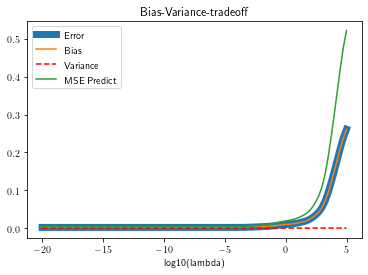

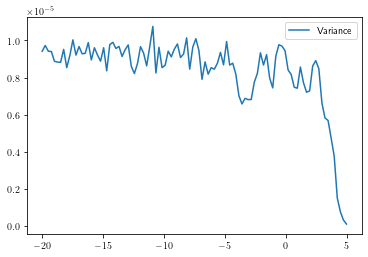

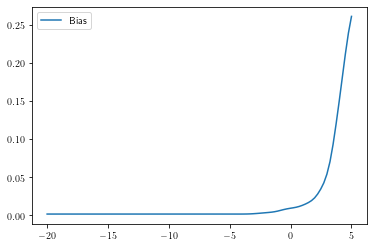

In [13]:
np.random.seed(3155)

# Setting up lambda interval
nlambdas = 100; lambdas = np.logspace(-20, 5, nlambdas)
# Setting up storage arrays
error = np.zeros(nlambdas); bias = np.zeros(nlambdas); variance = np.zeros(nlambdas)
MSE_predict = np.zeros(nlambdas)

# Setting up mesgrids of data
N = 100; x = np.sort(np.random.uniform(0, 1, N)); y = np.sort(np.random.uniform(0, 1, N)) 
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z = z.ravel()
X = create_X(mx, my, n=5) # Design matrix
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2) # Splitting into train and test
# Scaling, only needed if noise in Franke function output
#X_offset = np.mean(X_test, axis=0); z_offset = np.mean(z_train, axis=0)
I = np.eye(X_train.shape[1], X_train.shape[1])
n_bootstraps = 100
# Iterating through lambda values
for lmbda in range(nlambdas): 
    l = lambdas[lmbda]
    # Array for storing predict values
    zpred = np.zeros((z_test.shape[0], n_bootstraps))
    for i in range(n_bootstraps): 
        # Resampling
        x_, z_ = resample(X_train, z_train)
        # Making ridgebeta based on lambdavalue
        ridgebeta = np.linalg.inv(x_.T @ x_ + l*I) @ x_.T @ z_
        # Storing prediction values in array
        zpred[:, i] = X_test @ ridgebeta
    # Storing values in appropriate array
    error[lmbda] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[lmbda] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[lmbda] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[lmbda] = bias[lmbda] + variance[lmbda] + error[lmbda]
# Plotting error, bias, variance and MSE_predict against log10(lambdavalue)
plt.plot(np.log10(lambdas), error, linewidth=7, label='Error')
plt.plot(np.log10(lambdas), bias, label='Bias')
plt.plot(np.log10(lambdas), variance, 'r--', label='Variance')

plt.plot(np.log10(lambdas), MSE_predict, label='MSE Predict')

plt.xlabel('log10(lambda)'); plt.title('Bias-Variance-tradeoff'); 
plt.legend(); plt.show()
# Plotting variance against log10(lambda)
plt.plot(np.log10(lambdas), variance, label="Variance")
plt.legend()
plt.show()
# Plotting bias against log10(lambda)
plt.plot(np.log10(lambdas), bias, label="Bias")
plt.legend()
plt.show()

### Cross-validation, Ridge

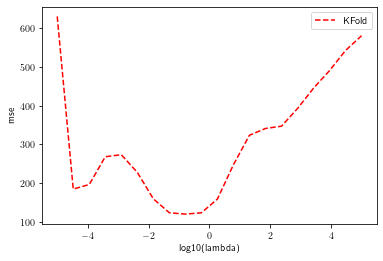

In [14]:
import sklearn.linear_model as skl
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold #new
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score #new
from sklearn.preprocessing import PolynomialFeatures

np.random.seed(3155)

#nlambdas = 20; lambdas = np.logspace(-4, 1, nlambdas)

n = 5
N = 100
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z_arr = z.ravel()
X = create_X(mx, my, n=n)

def crossvalidation_ridge(k, nlambdas,lambdas):
    
    scores_KFold = np.zeros((nlambdas,k))

    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))

    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
                train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]]))
       
        xtrain = X[train_inds]
        ztrain = z_arr[train_inds]

        xtest = X[test_inds]
        ztest = z_arr[test_inds]
    
        #scaler = StandardScaler(); scaler.fit(xtrain)
        #xtrain = scaler.transform(xtrain)
        #xtest = scaler.transform(xtest)
        
        I = np.eye(xtrain.shape[1],xtrain.shape[1])
    
        #for different values of lambda
        for j in range(len(lambdas)):
 
            ridgebeta = np.linalg.inv(xtrain.T @ xtrain +lambdas[j]*I) @ xtrain.T @ ztrain
    
            z_pred = xtest @ ridgebeta
            scores_KFold[j,k] = np.sum((z_pred.reshape(-1,1) - ztest)**2)/np.size(z_pred)


    estimated_mse_KFold = np.mean(scores_KFold,axis=1)
    
    return estimated_mse_KFold

#for k in range(5,10+1):
#    print('k-fold: ', k, '     ', crossvalidation_ridge(k))
nlambdas = 20
lambdas = np.logspace(-5, 5, nlambdas)

estimated_mse_KFold = crossvalidation_ridge(5, nlambdas, lambdas)

plt.figure()
#plt.plot(np.log10(lambdas), estimated_mse_sklearn, label = 'cross_val_score')
plt.plot(np.log10(lambdas), estimated_mse_KFold, 'r--', label = 'KFold')
plt.xlabel('log10(lambda)'); plt.ylabel('mse')
plt.legend(); plt.show()

### Comparison between own cv and sk cv

In [15]:
def crossvalidation_ridgescikit(k, n, lmb):
    kfold = KFold(n_splits = k) 
    ridgefit = skl.Ridge(alpha=lmb)
    estimated_mse_folds = cross_val_score(ridgefit, X, z_arr[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

print('        ', '      ', 'crossvalidation scikit', '    ','crossvalidation ridge')
a = 5
b = 11
ridge_owncv_mse = np.zeros(b-a)
ridge_scicv_mse = np.zeros(b-a)
for k in range(a, b):
    print('k-fold: ', k, '     ', crossvalidation_ridgescikit(k, 1, 1e-1), '       ', crossvalidation_ridge(k, 1, [1e-1]))
    ridge_owncv_mse[k-a] = crossvalidation_ridge(k, 1, [1e-4]); ridge_scicv_mse[k-a] = crossvalidation_ridgescikit(k, 1, 1e-4)

                crossvalidation scikit      crossvalidation ridge
k-fold:  5       0.11255549160004555         [119.84525153]
k-fold:  6       0.061978308051325155         [125.34599485]
k-fold:  7       0.02818410661080526         [143.90332727]
k-fold:  8       0.020526999316252924         [139.49774969]
k-fold:  9       0.01791796805707679         [140.45700544]
k-fold:  10       0.015794466230268287         [146.08937773]


## EXERCISE 5 
### Lasso

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.5324716484957435, tolerance: 0.07274439596325069
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3560841909134354, tolerance: 0.07274439596325069
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.5189905060747293, tolerance: 0.07274439596325069
  model = cd_fast.enet_coordinate_descent(


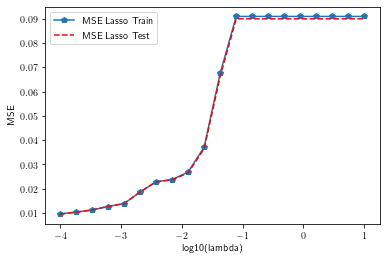

In [16]:
from sklearn.model_selection import train_test_split
import sklearn.linear_model as skl
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

np.random.seed(3155)

# Setting up meshgrids of data, calculating design matrix
n = 5
N = 100
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z = z.ravel()
X = create_X(mx, my, n=n)

# Splitting data into train and test
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2) 
nlambdas = 20; lambdas = np.logspace(-4, 1, nlambdas)
# Storage arrays for MSE train and test
Lasso_MSEPredict = np.zeros(nlambdas); Lasso_MSETrain = np.zeros(nlambdas)

# Iterating through lambdavalues
for i in range(nlambdas):
    
    lmb = lambdas[i]
    
    # Performs lasso regression using sklearn package
    lassofit = skl.Lasso(alpha=lmb).fit(X_train,z_train)
    lassoz_train = lassofit.predict(X_train)
    lassoz_test = lassofit.predict(X_test)
    
    # Storing MSE for train and test 
    Lasso_MSEPredict[i] = mean_squared_error(z_test,lassoz_test)
    Lasso_MSETrain[i] = mean_squared_error(z_train,lassoz_train)
    
  
plt.figure()

plt.plot(np.log10(lambdas), Lasso_MSETrain, 'p-', label = 'MSE Lasso Train')
plt.plot(np.log10(lambdas), Lasso_MSEPredict, 'r--', label = 'MSE Lasso Test')

plt.xlabel('log10(lambda)')
plt.ylabel('MSE')
plt.legend()
plt.show()

### Bootstrap analysis of LASSO

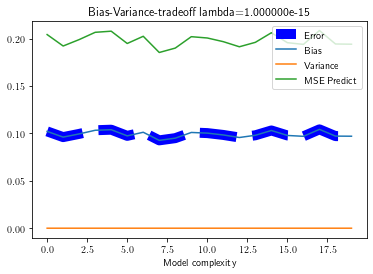

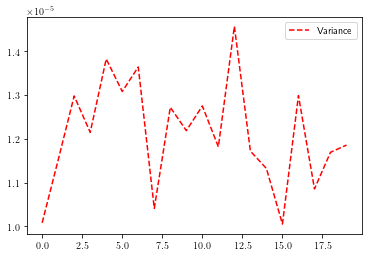

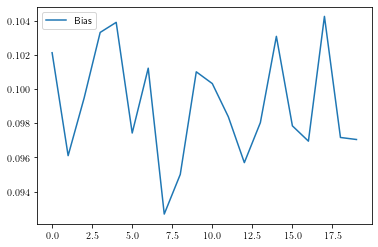

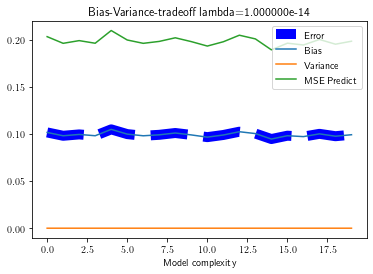

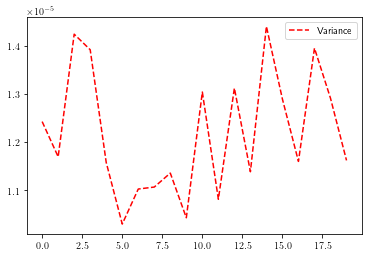

...

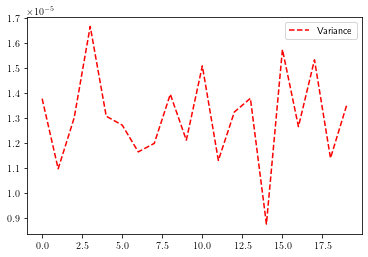

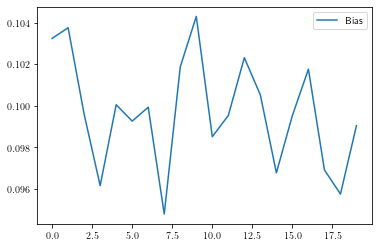

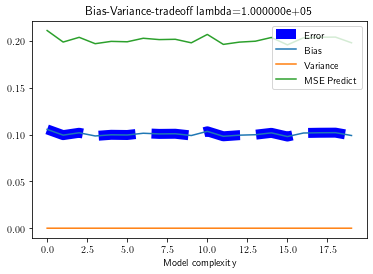

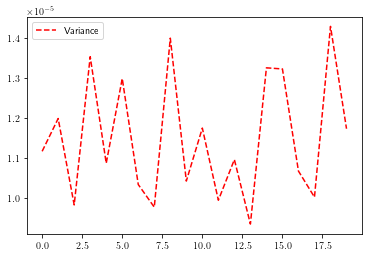

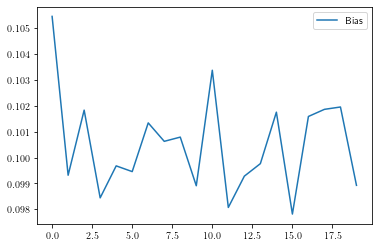

0
7
0.09269302090206921
Lowest MSE: 9.269302e-02, std: 7.486657e-05


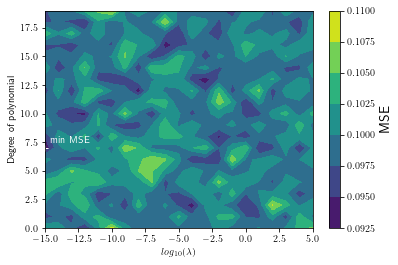

In [152]:
np.random.seed(3155)

# Using optimal lambda from code above
nlambdas = 21; lambdas = np.logspace(-15, 5, nlambdas)
# Setting up meshgrid of data
N = 100
maxdegree = 20 # maximal degree of polynomial we are testing
n_bootstraps = 100
x = np.sort(np.random.uniform(0, 1, N)) 
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my) + 0.1*np.random.randn(N,N)
z = z.ravel()

# Arrays to store values 
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
MSE_l_d_mean = np.zeros((maxdegree, nlambdas))
MSE_l_d_std  = np.zeros((maxdegree, nlambdas))
MSE_l_d_var = np.zeros((maxdegree, nlambdas))
R2_l_d = np.zeros((maxdegree, nlambdas))
MSE_n = np.zeros(n_bootstraps)
R2_n = np.zeros(n_bootstraps)

error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree)

# Looping through all lambda values 
for j in range(nlambdas): 
    lmbda = lambdas[j]
    # Looping through all degrees
    for degree in range(maxdegree): 
        # Creating design matrix based on degree
        X = create_X(mx, my, n=degree)
        X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
        # Creating identity matrix
        I = np.eye(X_train.shape[1], X_train.shape[1])
        # Arrays to store prediction values
        zpred = np.empty((z_test.shape[0], n_bootstraps))
        ztrain = np.empty((z_train.shape[0], n_bootstraps))
        # Looping through the bootstrap
        for i in range(n_bootstraps): 
            # Resampling
            x_, z_ = resample(X_train, z_train)
            # Performing lasso regression
            lassofit = skl.Lasso(alpha=lmb).fit(x_,z_)
            # make predictions
            zp = lassofit.predict(X_test)
            zpred[:, i] = lassofit.predict(X_test)
            ztrain[:, i] = lassofit.predict(x_)
            MSE_n[i] = MSE(z_test, zp)
            R2_n[i] = R2(z_test, zp)
        # Adding values to their respective array
        MSE_l_d_mean[degree, j] = np.mean(MSE_n)
        MSE_l_d_std[degree, j] = np.std(MSE_n)
        MSE_l_d_var[degree, j] = np.var(MSE_n)
        R2_l_d[degree, j] = np.mean(R2_n)
        polydegree[degree] = degree
        error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
        bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
        variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
        MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
        """
        error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
        bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
        variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
        MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]
        """
    # Plotting bias variance tradeoff against for lambdas
    plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
    plt.plot(polydegree, bias, label='Bias')
    plt.plot(polydegree, variance, label='Variance')
    plt.plot(polydegree, MSE_predict, label='MSE Predict')
    plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff lambda={:e}'.format(lmbda))
    #plt.xlim(0, 15); plt.ylim(0, 0.009)
    save_fig('BiasVarTradeLasso_lambda_{:e}'.format(lmbda))
    plt.legend(); plt.show()

    #plt.figure()
    #plt.plot(polydegree, MSE_Train,label='MSE Train'); 
    #plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

    plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeLasso_lambda_{:e}'.format(lmbda)); plt.show()
    plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeRidge_lambda_{:e}'.format(lmbda)); plt.show()

min_val = []
min_d = []
for i in range(nlambdas): 
    min_d.append(np.argmin(MSE_l_d_mean[:, i]))
    min_val.append(min(MSE_l_d_mean[:, i]))

min_lambda = np.argmin(min_val)
min_degree = min_d[min_lambda]
print(min_lambda); print(min_degree)

#print(np.argmin(min_val))
#print(min_d[min_lambda])
print(MSE_l_d_mean[min_degree, min_lambda])
lowest_MSE = MSE_l_d_mean[min_degree, min_lambda]
STD_lowest_MSE = MSE_l_d_std[min_degree, min_lambda]
var_lowest_MSE = MSE_l_d_var[min_degree, min_lambda]
print("Lowest MSE: {:e}, std: {:e}".format(lowest_MSE, STD_lowest_MSE))

plt.contourf(np.log10(lambdas), polydegree, MSE_l_d_mean); plt.plot(np.log10(lambdas[min_lambda]), min_degree, "w+"); plt.text(np.log10(lambdas[min_lambda])+0.4, min_degree+0.4, "min MSE", color = "w")
plt.xlabel(r'$log_{10}(\lambda)$'); plt.ylabel('Degree of polynomial'); cb = plt.colorbar(); cb.set_label(label="MSE", size=14)
save_fig('BestlambdadegreeLasso'); plt.show()

### Bootstrap BVTradeoff (Lasso) against lambda parameter. 

In [ ]:
np.random.seed(3155)

# Setting up lambda interval and arrays to store information
nlambdas = 100; lambdas = np.logspace(-20, 5, nlambdas)
error = np.zeros(nlambdas); bias = np.zeros(nlambdas); variance = np.zeros(nlambdas)
MSE_predict = np.zeros(nlambdas)
# Setting up meshgrids of data
N = 100; x = np.sort(np.random.uniform(0, 1, N)); y = np.sort(np.random.uniform(0, 1, N)) 
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z = z.ravel()
# Design matrix
X = create_X(mx, my, n=5)
# Splitting data into train and test
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
X_offset = np.mean(X_test, axis=0); z_offset = np.mean(z_train, axis=0)
# Identity matrix
I = np.eye(X_train.shape[1], X_train.shape[1])
# Number of iterations in the resampling loop
n_bootstraps = 100
# Lambda loop
for lmbda in range(nlambdas): 
    l = lambdas[lmbda]
    lasso = Lasso(alpha=l,max_iter=1000000)#.fit(X_train,z_train) # setting up sklearns lasso
    # array for storing predictions on z for all bootstrap iterations
    zpred = np.zeros((z_test.shape[0], n_bootstraps))
    for i in range(n_bootstraps): 
        # Resampling
        x_, z_ = resample(X_train, z_train)
        # Performing lassofit on resampled data
        lassofit = lasso.fit(x_, z_)
        # Performing predictions
        lassoz_train = lassofit.predict(x_)
        zpred[:, i] = lassofit.predict(X_test)
    # Storing information in arrays
    error[lmbda] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[lmbda] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[lmbda] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[lmbda] = bias[lmbda] + variance[lmbda] + error[lmbda]

    
# Plotting error, bias, variance and MSE_predict against log10(lambda)
plt.plot(np.log10(lambdas), error, linewidth=7, label='Error')
plt.plot(np.log10(lambdas), bias, label='Bias')
plt.plot(np.log10(lambdas), variance, 'r--', label='Variance')

plt.plot(np.log10(lambdas), MSE_predict, label='MSE Predict')

plt.xlabel('log10(lambda)'); plt.title('Bias-Variance-tradeoff'); 
plt.legend(); plt.show()
# Plotting variance against log10(lambda)
plt.plot(np.log10(lambdas), variance, label="Variance")
plt.legend()
plt.show()
# Plotting bias against log10(lambda)
plt.plot(np.log10(lambdas), bias, label="Bias")
plt.legend()
plt.show()

C:\Users\Derya\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.465092705977754, tolerance: 0.07286371941547581
  positive)
C:\Users\Derya\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.20825817736616, tolerance: 0.07112870687093792
  positive)
C:\Users\Derya\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.2440594622152865, tolerance: 0.07169593695201684
  positive)
C:\Users\Derya\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality

### Cross-validation Lasso

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2687981060154558, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1076096294337079, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.8279274092492326, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py

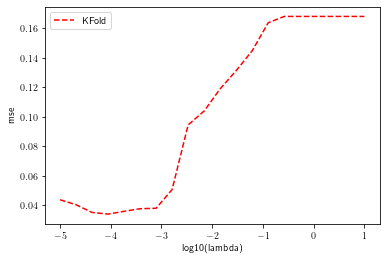

In [19]:
import sklearn.linear_model as skl
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold #new
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score #new
from sklearn.preprocessing import PolynomialFeatures

np.random.seed(3155)

nlambdas = 20; lambdas = np.logspace(-5, 1, nlambdas)

n = 5
N = 100
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = FrankeFunction(mx, my)
z_arr = z.ravel()
X = create_X(mx, my, n=n)

def crossvalidation_lasso(k, nlambdas,lambdas):
    
    scores_KFold = np.zeros((nlambdas,k))

    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))
    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
                train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]]))
       
        xtrain = X[train_inds]
        ztrain = z_arr[train_inds]

        xtest = X[test_inds]
        ztest = z_arr[test_inds]
    
        scaler = StandardScaler(); scaler.fit(xtrain)
        xtrain = scaler.transform(xtrain)
        xtest = scaler.transform(xtest)
    
        #for different values of lambda
        for j in range(len(lambdas)):
    
            lassofit = skl.Lasso(alpha=lambdas[j]).fit(xtrain,ztrain)
            z_pred = lassofit.predict(xtest)
    
            scores_KFold[j,k] = np.sum((z_pred - ztest)**2)/np.size(z_pred)

    estimated_mse_KFold = np.mean(scores_KFold,axis=1)
    
    return estimated_mse_KFold

#for k in range(5,10+1):
#    print('k-fold: ', k, '     ', crossvalidation_ridge(k))

estimated_mse_KFold = crossvalidation_lasso(5, nlambdas, lambdas)

plt.figure()
#plt.plot(np.log10(lambdas), estimated_mse_sklearn, label = 'cross_val_score')
plt.plot(np.log10(lambdas), estimated_mse_KFold, 'r--', label = 'KFold')
plt.xlabel('log10(lambda)'); plt.ylabel('mse')
plt.legend(); plt.show()

### Comparison between own cv and sk cv for Lasso

In [20]:
def crossvalidation_lassoscikit(k, n, lmb):
    kfold = KFold(n_splits = k) 
    lassofit = skl.Lasso(alpha=lmb)
    estimated_mse_folds = cross_val_score(lassofit, X, z_arr[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

print('        ', '      ', 'crossvalidation scikit', '    ','crossvalidation lasso')
a = 5
b = 11
lasso_owncv_mse = np.zeros(b-a)
lasso_scicv_mse = np.zeros(b-a)
for k in range(a, b):
    print('k-fold: ', k, '     ', crossvalidation_lassoscikit(k, 1, 1e-4), '       ', crossvalidation_lasso(k, 1, [1e-4]))
    lasso_owncv_mse[k-a] = crossvalidation_lasso(k, 1, [1e-4]); lasso_scicv_mse[k-a] = crossvalidation_lassoscikit(k, 1, 1e-4)
    
print(lasso_owncv_mse)
print(lasso_scicv_mse)

                crossvalidation scikit      crossvalidation lasso


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.35867569184058823, tolerance: 0.05831900192018561
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.07325039173093, tolerance: 0.06199784456069044
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.8983389739277499, tolerance: 0.08633810532669299
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: C

k-fold:  5       0.06798047206859714         [0.03440842]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4682449227020433, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4682449227020433, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4682449227020433, tolerance: 0.0041028471528358566
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py

k-fold:  6       0.05201099146363531         [0.04545431]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.37019246806192596, tolerance: 0.00304931638379924
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.37019246806192596, tolerance: 0.00304931638379924
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.37019246806192596, tolerance: 0.00304931638379924
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:53

k-fold:  7       0.03257946084249959         [0.07286131]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4133709333619333, tolerance: 0.002511345873595013
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4133709333619333, tolerance: 0.002511345873595013
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.4133709333619333, tolerance: 0.002511345873595013
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:53

k-fold:  8       0.02682837463628923         [0.07709486]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.35230348562837244, tolerance: 0.002180416794233948
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.35230348562837244, tolerance: 0.002180416794233948
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.35230348562837244, tolerance: 0.002180416794233948
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py

k-fold:  9       0.024660799032600798         [0.09348939]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.3212444082871939, tolerance: 0.0018645788253037273
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.3212444082871939, tolerance: 0.0018645788253037273
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.3212444082871939, tolerance: 0.0018645788253037273
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py

k-fold:  10       0.022087134678170757         [0.11689792]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.29975442040810474, tolerance: 0.0016327649384094323
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.29975442040810474, tolerance: 0.0016327649384094323
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.29975442040810474, tolerance: 0.0016327649384094323
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent

[0.03440842 0.04545431 0.07286131 0.07709486 0.09348939 0.11689792]
[0.06798047 0.05201099 0.03257946 0.02682837 0.0246608  0.02208713]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.243514850282793, tolerance: 0.07991654604104137
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.373745015892382, tolerance: 0.08048608848978016
  model = cd_fast.enet_coordinate_descent(


### Exercise 6
Dataset

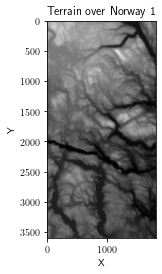

[[1161 1165 1169 ...  931  922  922]
 [1168 1171 1174 ...  941  928  922]
 [1172 1173 1176 ...  945  934  924]
 ...
 [ 673  677  681 ...  300  300  297]
 [ 675  677  681 ...  296  297  294]
 [ 677  680  682 ...  292  294  292]]


In [5]:
import numpy as np
from imageio import imread
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
# Load the terrain
terrain1 = imread("SRTM_data_Norway_1.tif")
# Show the terrain
plt.figure()
plt.title("Terrain over Norway 1")
plt.imshow(terrain1, cmap="gray")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()
print(terrain1)

In [22]:
print(terrain1)
print(terrain1.shape)

[[1161 1165 1169 ...  931  922  922]
 [1168 1171 1174 ...  941  928  922]
 [1172 1173 1176 ...  945  934  924]
 ...
 [ 673  677  681 ...  300  300  297]
 [ 675  677  681 ...  296  297  294]
 [ 677  680  682 ...  292  294  292]]
(3601, 1801)


### Attempt at ordinary least square fit

In [100]:
from sklearn.preprocessing import MinMaxScaler
terrain1 = imread("SRTM_data_Norway_1.tif")
# Cutting dataset from 3601x1801 to 100x100
N = 35
terrain = terrain1[:N, :N]
# Setting up meshgrid for calculations. 
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
xx, yy = np.meshgrid(x, y)
z = terrain
z_arr = float(z.ravel()) # one-dim array out of terrain

n = 15 # degree of polynomial fit

# Design matrix out of meshgrid values
X = create_X(xx, yy, n=n)
# Splitting data into train and test
X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)

# Scaling
X_train -= np.mean(X_train, axis=0); X_test -= np.mean(X_train, axis=0)
z_train -= np.mean(z_train, axis=0); z_test -= np.mean(z_train, axis=0)

# Performing OLS regression
olsbeta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train

zpred = X_test @ olsbeta
zfull = X @ olsbeta
zplot = zfull.reshape(N, N)



MSEPredict = MSE(z_test, zpred)
print("MSE test error: % .5f" % MSEPredict)
R2Predict = R2(z_test, zpred)
print("R2 test: % .5f" % R2Predict)

plt.figure()
plt.title("Terrain over Norway 1")
plt.imshow(z, cmap="gray")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

plt.figure()
plt.title("Terrain over Norway 1")
plt.imshow(zplot, cmap="gray")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()


TypeError: only size-1 arrays can be converted to Python scalars

### OLS fit with different polynomial degrees

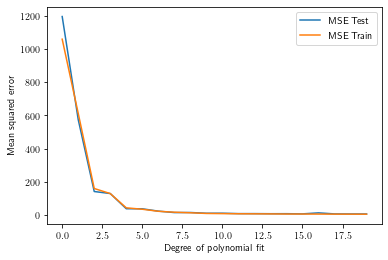

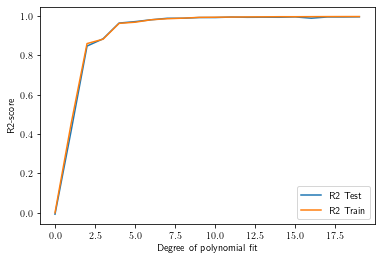

Minimal MSE using OLS
5.847701118791414
using polyfit with n=19
Best R2
0.9943495751003731


In [101]:
np.random.seed(3155)
terrain = imread("SRTM_data_Norway_1.tif")
maxdegree = 20
N = 35
terrain = terrain[:N,:N]
# Creates mesh of image pixels
x = np.linspace(0,1, np.shape(terrain)[0])
y = np.linspace(0,1, np.shape(terrain)[1])
x_mesh, y_mesh = np.meshgrid(x,y)
z = terrain
# Creates arrays to store info
MSETest = np.zeros(maxdegree)
MSETrain = np.zeros(maxdegree)
R2Test = np.zeros(maxdegree)
R2Train = np.zeros(maxdegree)
polyfit = np.zeros(maxdegree)
for degree in range(maxdegree): 
    polyfit[degree] = degree
    # Design matrix
    X = create_X(x_mesh, y_mesh, degree)
    # Splitting data into train and test
    X_train, X_test, z_train, z_test = train_test_split(X, z.ravel(), test_size=0.2)
    # Calculates beta
    beta = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ z_train
    # Performs predictions
    zpred = X_test @ beta
    ztilde = X_train @ beta
    
    # Collecting data from each iteration
    MSETest[degree] = MSE(z_test, zpred)
    MSETrain[degree] = MSE(z_train, ztilde)
    R2Test[degree] = R2(z_test, zpred)
    R2Train[degree] = R2(z_train, ztilde)

# Plots MSE test and train against degree of polynomial
plt.plot(polyfit, MSETest, label="MSE Test")
plt.plot(polyfit, MSETrain, label="MSE Train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("Mean squared error")
plt.legend()
plt.show()
# Plots R2 test and train against degree of polynomial
plt.plot(polyfit, R2Test, label="R2 Test")
plt.plot(polyfit, R2Train, label="R2 Train")
plt.xlabel("Degree of polynomial fit")
plt.ylabel("R2-score")
plt.legend()
plt.show()

# Prints minimal MSE with degree and R2
print("Minimal MSE using OLS")
print(min(MSETest))
print("using polyfit with n=%1d" % np.argmin(MSETest))
print("Best R2")
print(R2Test[np.argmin(MSETest)])


### BVTradeoff OLS

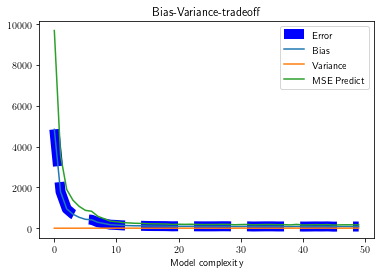

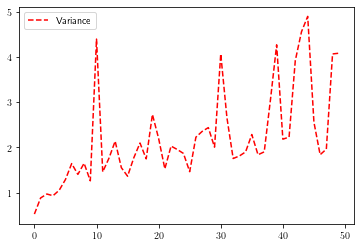

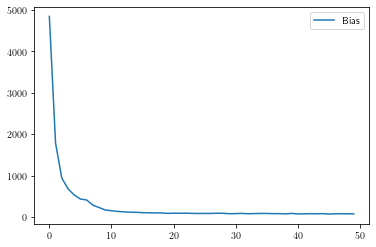

In [25]:
np.random.seed(3155)
terrain = imread("SRTM_data_Norway_1.tif")
# Setting up meshgrid of values and dataset
N = 35
terrain = terrain[:N, :N]
maxdegree = 50 # maximal degree of polynomial
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
x_mesh, y_mesh = np.meshgrid(x, y)
z = terrain
# Arrays for information storage
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
n_bootstraps = 100

error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree);

# Looping through all polynomial degrees up to maxdegree
for degree in range(maxdegree): 
    # Creates design matrix
    X = create_X(x_mesh, y_mesh, n=degree)
    # Splitting data into train and test data
    X_train, X_test, z_train, z_test = train_test_split(X, z.ravel(), test_size=0.2)
    X_offset = np.average(X_train, axis=0)
    #X_train = X_train-X_offset
    #X_test = X_test -X_offset
    z_offset = np.average(z_train, axis=0)
    #z_train = z_train - z_offset
    #z_test = z_test - z_offset
    # Arrays for storage of prediction data
    zpred = np.empty((z_test.shape[0], n_bootstraps))
    ztrain = np.empty((z_train.shape[0], n_bootstraps))
    for i in range(n_bootstraps): 
        # Resampling
        x_, z_ = resample(X_train, z_train)
        # Calculates OLS beta based on resampled data
        olsbeta = OLS_beta(x_, z_)
        # Performs OLS regression
        zpred[:, i] = (X_test) @ olsbeta
        ztrain[:, i] = (x_) @ olsbeta
    # Stores data    
    polydegree[degree] = degree
    error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
    """
    error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
    bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
    variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
    MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]
    """
# Plots error, bias, variance and predicted MSE against degree of polynomial
plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
plt.plot(polydegree, bias, label='Bias')
plt.plot(polydegree, variance, label='Variance')
plt.plot(polydegree, MSE_predict, label='MSE Predict')
plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff')
#plt.xlim(0, 15); plt.ylim(0, 0.009)
save_fig('BiasVarTradeOLS')
plt.legend(); plt.show()

#plt.figure()
#plt.plot(polydegree, MSE_Train,label='MSE Train'); 
#plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

# Plots variance against degree of polynomial
plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeOLS'); plt.show()
# Plots bias against degree of polynomial
plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeOLS'); plt.show()

### Discussion of BVTRADEOFF
WE see blabla. 

In [26]:
import sklearn.linear_model as skl
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold #new
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score #new
from sklearn.preprocessing import PolynomialFeatures

np.random.seed(3155)

n = 10
N = 100
terrain = terrain1[:N, :N]
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
m_x, m_y = np.meshgrid(x, y)
z = terrain
print(z.shape)
z = z.ravel()
X = create_X(m_x, m_y, n=n)

def crossvalidation_ols(k):
    
    scores_KFold = np.zeros(k)

    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))

    i = 0
    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
               train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]]))
       
        xtrain = X[train_inds]
        ztrain = z[train_inds]

        xtest = X[test_inds]
        ztest = z[test_inds]
    
        scaler = StandardScaler(); scaler.fit(xtrain)
        xtrain = scaler.transform(xtrain)
        xtest = scaler.transform(xtest)
    
        olsfit = skl.LinearRegression().fit(xtrain, ztrain)
        olsz_test = olsfit.predict(xtest)

        #scores_KFold[0][i] = np.sum((olsz_test - ztest)**2)/np.size(olsz_test)
        scores_KFold[i] = MSE(ztest, olsz_test)
        i += 1 

    estimated_mse_KFold = np.mean(scores_KFold)
    
    return estimated_mse_KFold

for k in range(5,10+1):
    print('k-fold: ', k, '     ', crossvalidation_ols(k))

(100, 100)
k-fold:  5       14309862792888.365
k-fold:  6       8.194003355782653e+16
k-fold:  7       1.9395498593329762e+19
k-fold:  8       6.809944712881689e+18
k-fold:  9       4.309393841535939e+20
k-fold:  10       7.614009299987827e+18


In [27]:
def crossvalidation_scikit(k):
    kfold = KFold(n_splits = k) 
    olsfit = skl.LinearRegression()
    estimated_mse_folds = cross_val_score(olsfit, X, z[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

print('        ', '      ', 'crossvalidation scikit', '    ','crossvalidation ols')
for k in range(10,20+1):
    print('k-fold: ', k, '     ', crossvalidation_scikit(k), '       ', crossvalidation_ols(k))

                crossvalidation scikit      crossvalidation ols
k-fold:  10       55815.021256542976         7.614009299987827e+18
k-fold:  11       54879.52184980894         1.3336899305763085e+20
k-fold:  12       22638.570324742876         7.0303474058469106e+19
k-fold:  13       15789.004507874586         8.473107565307431e+18
k-fold:  14       9267.3668189333         6.722493386612939e+20
k-fold:  15       7928.144970789721         3.062952809329242e+20
k-fold:  16       4871.318484753168         6.993893432136945e+21
k-fold:  17       5427.612755702875         1.308041600760966e+23
k-fold:  18       3303.553361831061         1.7242373474546156e+20
k-fold:  19       2159.18042609231         7.836036192653149e+21
k-fold:  20       2515.146896484375         1.2111379880469103e+22


### Ridge fit

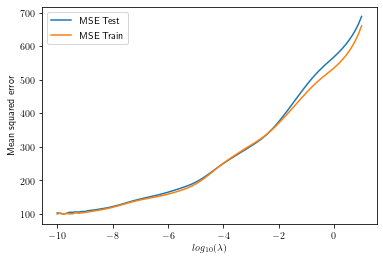

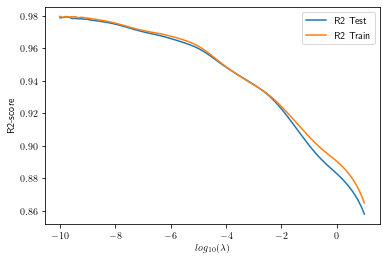

Minimal MSE when lambda =10^-%d -9.777777777777779
Minimal MSE:  100.21
Maximum R2:  0.97931


In [28]:
N=35
n = 19
terrain = terrain1[:N, :N]
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
mx, my = np.meshgrid(x, y)
z = terrain
z_arr = z.ravel()
X = create_X(mx, my, n=n)
X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
I = np.eye(X_train.shape[1], X_train.shape[1]) 
nlambdas = 100; lambdas = np.logspace(-10, 1, nlambdas)
MSETest = np.zeros(nlambdas); MSETrain = np.zeros(nlambdas); R2Test = np.zeros(nlambdas); R2Train = np.zeros(nlambdas)

for i in range(nlambdas): 
    lmb = lambdas[i]
    ridgebeta = np.linalg.pinv(X_train.T @ X_train + lmb*I) @ X_train.T @ z_train
    zpred = X_test @ ridgebeta
    ztilde = X_train @ ridgebeta
    
    MSETest[i] = MSE(z_test, zpred); MSETrain[i] = MSE(z_train, ztilde); R2Test[i] = R2(z_test, zpred); R2Train[i] = R2(z_train, ztilde)
    
    
plt.plot(np.log10(lambdas), MSETest, label="MSE Test")
plt.plot(np.log10(lambdas), MSETrain, label="MSE Train")
plt.xlabel(r'$log_{10}(\lambda)$')
plt.ylabel("Mean squared error")
plt.legend()
plt.show()

plt.plot(np.log10(lambdas), R2Test, label="R2 Test")
plt.plot(np.log10(lambdas), R2Train, label="R2 Train")
plt.xlabel(r'$log_{10}(\lambda)$')
plt.ylabel("R2-score")
plt.legend()
plt.show()

print("Minimal MSE when lambda =10^-%d", np.log10(lambdas[np.argmin(MSETest)]))
print("Minimal MSE: % .2f" % np.min(MSETest))
print("Maximum R2: % .5f" % R2Test[np.argmin(MSETest)])
    

### Bias-Variance tradeoff, Ridge against polynomial degree

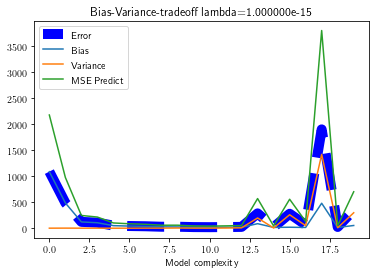

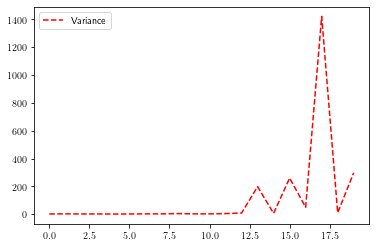

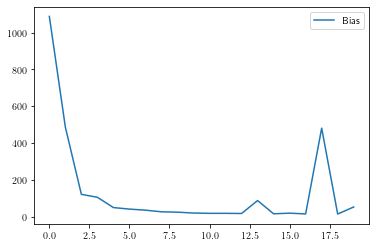

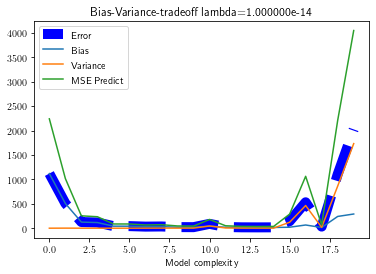

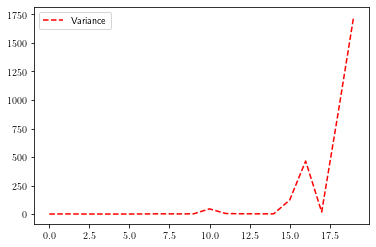

...

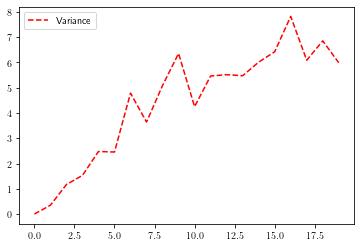

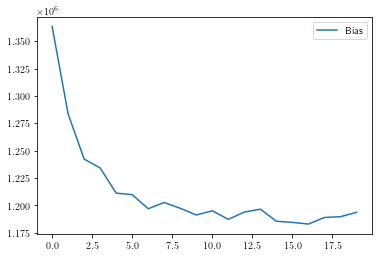

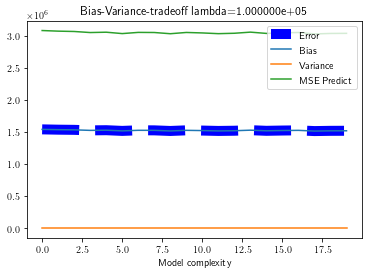

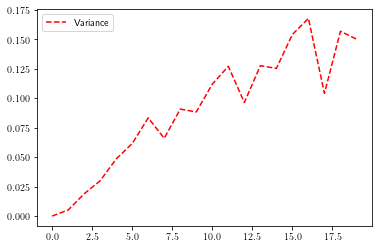

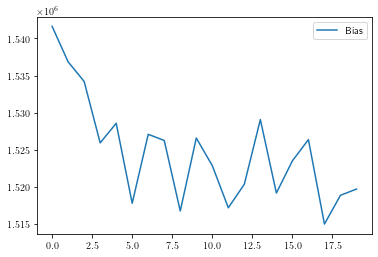

Best R2: 0.9830049432334331, std: 0.0012660501690696902
Lowest MSE: 1.607188e+01, std: 1.197278e+00


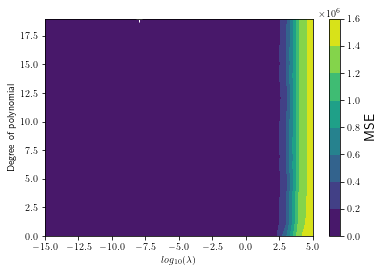

In [6]:
np.random.seed(3155)
terrain1 = imread("SRTM_data_Norway_1.tif")
# Using optimal lambda from code above
nlambdas = 21; lambdas = np.logspace(-15, 5, nlambdas)
# Setting up meshgrid of data
N = 30
terrain = terrain1[:N, :N]

maxdegree = 20 # maximal degree of polynomial we are testing
n_bootstraps = 100
x = np.sort(np.random.uniform(0, 1, N)) 
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = terrain
z_arr = z.ravel()

# Arrays to store values 
error = np.zeros(maxdegree)
bias = np.zeros(maxdegree)
variance = np.zeros(maxdegree)
MSE_predict = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree)
MSE_l_d_mean = np.zeros((maxdegree, nlambdas))
MSE_l_d_std  = np.zeros((maxdegree, nlambdas))
MSE_l_d_var = np.zeros((maxdegree, nlambdas))
R2_l_d = np.zeros((maxdegree, nlambdas))
R2_l_d_std = np.zeros((maxdegree, nlambdas))

MSE_n = np.zeros(n_bootstraps)
R2_n = np.zeros(n_bootstraps)

error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree) #train
MSE_Train = np.zeros(maxdegree)

# Looping through all lambda values 
for j in range(nlambdas): 
    lmb = lambdas[j]
    # Looping through all degrees
    for degree in range(maxdegree): 
        # Creating design matrix based on degree
        X = create_X(mx, my, n=degree)
        X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
        # Creating identity matrix
        I = np.eye(X_train.shape[1], X_train.shape[1])
        # Arrays to store prediction values
        zpred = np.empty((z_test.shape[0], n_bootstraps))
        ztrain = np.empty((z_train.shape[0], n_bootstraps))
        # Looping through the bootstrap
        for i in range(n_bootstraps): 
            # Resampling
            x_, z_ = resample(X_train, z_train)
            # creating ridgebeta
            ridgebeta = np.linalg.pinv(x_.T @ x_ + lmb* I) @ x_.T @ z_
            # make predictions
            zp = X_test @ ridgebeta
            zpred[:, i] = X_test @ ridgebeta
            ztrain[:, i] = x_ @ ridgebeta
            MSE_n[i] = MSE(z_test, zp)
            R2_n[i] = R2(z_test, zp)
        # Adding values to their respective array
        MSE_l_d_mean[degree, j] = np.mean(MSE_n)
        MSE_l_d_std[degree, j] = np.std(MSE_n)
        MSE_l_d_var[degree, j] = np.var(MSE_n)
        R2_l_d[degree, j] = np.mean(R2_n)
        R2_l_d_std[degree, j] = np.std(R2_n)
        polydegree[degree] = degree
        error[degree] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
        bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
        variance[degree] = np.mean( np.var(zpred, axis=1, keepdims=True) )
        MSE_predict[degree] = bias[degree] + variance[degree] + error[degree]
        """
        error_train[degree] = np.mean( np.mean((z_train.reshape(-1,1) - ztrain)**2, axis=1, keepdims=True) )
        bias_train[degree] = np.mean( (z_train.reshape(-1,1) - np.mean(ztrain, axis=1, keepdims=True))**2 )
        variance_train[degree] = np.mean( np.var(ztrain, axis=1, keepdims=True) )
        MSE_Train[degree] = bias_train[degree] + variance_train[degree] + error_train[degree]
        """
    # Plotting bias variance tradeoff against for lambdas
    plt.plot(polydegree, error, 'b--', linewidth=10, label='Error')
    plt.plot(polydegree, bias, label='Bias')
    plt.plot(polydegree, variance, label='Variance')
    plt.plot(polydegree, MSE_predict, label='MSE Predict')
    plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff lambda={:e}'.format(lmb))
    #plt.xlim(0, 15); plt.ylim(0, 0.009)
    save_fig('BiasVarTradeRidgeTERRAIN_lambda_{:e}'.format(lmb))
    plt.legend(); plt.show()

    #plt.figure()
    #plt.plot(polydegree, MSE_Train,label='MSE Train'); 
    #plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

    plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); save_fig('VarTradeRidgeTERRAIN_lambda_{:e}'.format(lmb)); plt.show()
    plt.plot(polydegree, bias, label='Bias'); plt.legend(); save_fig('BiasTradeRidgeTERRAIN_lambda_{:e}'.format(lmb)); plt.show()
min_val = []
min_d = []
for i in range(nlambdas): 
    min_d.append(np.argmin(MSE_l_d_mean[:, i]))
    min_val.append(min(MSE_l_d_mean[:, i]))

min_lambda = np.argmin(min_val)
min_degree = min_d[min_lambda]


#print(np.argmin(min_val))
#print(min_d[min_lambda])
#print(MSE_l_d_mean[min_degree, min_lambda])
lowest_MSE = MSE_l_d_mean[min_degree, min_lambda]
STD_lowest_MSE = MSE_l_d_std[min_degree, min_lambda]
var_lowest_MSE = MSE_l_d_var[min_degree, min_lambda]
print("Best R2: {}, std: {}".format(R2_l_d[min_degree, min_lambda], R2_l_d_std[min_degree, min_lambda]))
print("Lowest MSE: {:e}, std: {:e}".format(lowest_MSE, STD_lowest_MSE))

plt.contourf(np.log10(lambdas), polydegree, MSE_l_d_mean); plt.plot(np.log10(lambdas[min_lambda]), min_degree, "w+"); plt.text(np.log10(lambdas[min_lambda])+0.4, min_degree+0.4, "min MSE", color = "w")
plt.xlabel(r'$log_{10}(\lambda)$'); plt.ylabel('Degree of polynomial'); cb = plt.colorbar(); cb.set_label(label="MSE", size=14)
save_fig('BestlambdadegreeRidgeTERRAIN'); plt.show()


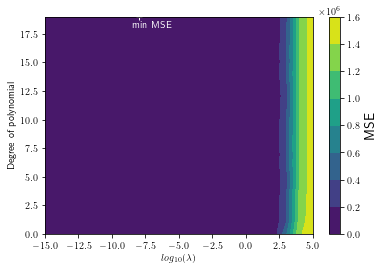

In [175]:
plt.contourf(np.log10(lambdas), polydegree, MSE_l_d_mean); plt.plot(np.log10(lambdas[min_lambda]), min_degree, "w+"); plt.text(np.log10(lambdas[min_lambda])-0.5, min_degree-0.9, "min MSE", color = "w")
plt.xlabel(r'$log_{10}(\lambda)$'); plt.ylabel('Degree of polynomial'); cb = plt.colorbar(); cb.set_label(label="MSE", size=14)
save_fig('BestlambdadegreeRidgeTERRAIN'); plt.show()


### Ridge with Bootstraps resampling method

Lambda val:
1e-05


<ipython-input-30-65c360d56250>:48: RuntimeWarning: invalid value encountered in subtract
  error[i] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
<ipython-input-30-65c360d56250>:48: RuntimeWarning: overflow encountered in square
  error[i] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
/usr/lib/python3/dist-packages/numpy/core/_methods.py:151: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
/usr/lib/python3/dist-packages/numpy/core/_methods.py:151: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
<ipython-input-30-65c360d56250>:49: RuntimeWarning: overflow encountered in square
  bias[i] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
/usr/lib/python3/dist-packages/numpy/core/_methods.py:183: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True)
/usr/li

Predicted MSE
nan
Error
nan
Bias
nan
Variance
nan
Lambda val:
2.3357214690901213e-05
Predicted MSE
634.0872481978232
Error
317.0436240989116
Bias
314.67922903035947
Variance
2.3643950685521067
Lambda val:
5.4555947811685143e-05
Predicted MSE
673.1889215318756
Error
336.5944607659379
Bias
334.3587856743113
Variance
2.2356750916265393
Lambda val:
0.00012742749857031334
Predicted MSE
713.8814804613663
Error
356.9407402306832
Bias
354.81647656914794
Variance
2.1242636615351547
Lambda val:
0.00029763514416313193
Predicted MSE
750.67820749883
Error
375.339103749415
Bias
373.3477943733213
Variance
1.9913093760937002
Lambda val:
0.0006951927961775605
Predicted MSE
785.0366593244912
Error
392.5183296622457
Bias
390.49697893900935
Variance
2.021350723236275
Lambda val:
0.001623776739188721
Predicted MSE
826.5711933648608
Error
413.2855966824303
Bias
411.0835871714896
Variance
2.2020095109407865
Lambda val:
0.00379269019073225
Predicted MSE
879.246473592899
Error
439.62323679644936
Bias
437.33925

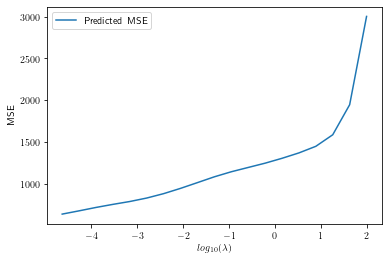

In [30]:
# Setting up lambdavalues
nlambdas = 21; lambdas = np.logspace(-15, 5, nlambdas);
np.random.seed(3155)
N = 100
# Setting up meshgrid of values and terrain
terrain = terrain1[:N, :N]
x = np.sort(np.random.uniform(0, 1, np.shape(terrain)[0]))
y = np.sort(np.random.uniform(0, 1, np.shape(terrain)[1]))
mx, my = np.meshgrid(x, y)
z = terrain
z_arr = z.ravel()

n = 15 # Polynomial degree

n_bootstraps = 100 # number of iterations in resampling loop
# Arrays for storage of information
error = np.zeros(n_bootstraps)
bias = np.zeros(n_bootstraps)
variance = np.zeros(n_bootstraps)
MSE_predict = np.zeros(n_bootstraps)

MSE_l = np.zeros(nlambdas)


# Design matrix
X = create_X(mx, my, n=n)
# Splitting into train and test datasets
X_train, X_test, z_train, z_test = train_test_split(X, z_arr, test_size=0.2)
# Identity matrix
I = np.eye(X_train.shape[1], X_train.shape[1])
# Arrays for storage of info 
zpred = np.empty((z_test.shape[0], n_bootstraps))
ztilde = np.empty((z_train.shape[0], n_bootstraps))
# Looping through the lambdavalues in lambdas
for j in range(nlambdas): 
    lmb = lambdas[j]
    print("Lambda val:")
    print(lmb)
    for i in range(n_bootstraps):
        # Resampling
        x_, z_ = resample(X_train, z_train)
        # Calculating ridgebeta
        ridgebeta = np.linalg.pinv(x_.T @ x_ + lmb*I) @ x_.T @ z_
        # Performing Ridge regression
        zpred[:, i] = X_test @ ridgebeta
        ztilde[:, i] = x_ @ ridgebeta
        # Collecting data
        error[i] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
        bias[i] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
        variance[i] = np.mean( np.var(zpred, axis=1, keepdims=True) )
        MSE_predict[i] = bias[i] + variance[i] + error[i]
    print("Predicted MSE")
    print(np.mean(MSE_predict))
    print("Error")
    print(np.mean(error))
    print("Bias")
    print(np.mean(bias))
    print("Variance")
    print(np.mean(variance))
    
    MSE_l[j] = np.mean(MSE_predict)
# Plotting MSE with respect to lambda  
plt.plot(np.log10(lambdas), MSE_l, label="Predicted MSE")
plt.xlabel(r'$log_{10}(\lambda)$')
plt.ylabel("MSE")
plt.legend()
plt.show()


### Cross-validation, ridge

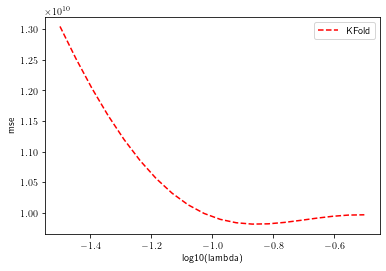

In [31]:
def crossvalidation_ridge(k, nlambdas,lambdas):
    
    scores_KFold = np.zeros((nlambdas,k))

    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))

    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
                train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]])) 
        
        xtrain = X[train_inds]
        ztrain = z.ravel()[train_inds]

        xtest = X[test_inds]
        ztest = z.ravel()[test_inds]
    
        scaler = StandardScaler(); scaler.fit(xtrain)
        xtrain = scaler.transform(xtrain)
        xtest = scaler.transform(xtest)
        
        I = np.eye(xtrain.shape[1],xtrain.shape[1])
    
        #for different values of lambda
        for j in range(len(lambdas)):
 
            ridgebeta = np.linalg.inv(xtrain.T @ xtrain +lambdas[j]*I) @ xtrain.T @ ztrain
    
            z_pred = xtest @ ridgebeta
            scores_KFold[j,k] = np.sum((z_pred.reshape(-1,1) - ztest)**2)/np.size(z_pred)


    estimated_mse_KFold = np.mean(scores_KFold,axis=1)
    
    return estimated_mse_KFold

#for k in range(5,10+1):
#    print('k-fold: ', k, '     ', crossvalidation_ridge(k))
nlambdas = 20
lambdas = np.logspace(-1.5, -0.5, nlambdas)
estimated_mse_KFold = crossvalidation_ridge(5, nlambdas = 20, lambdas = np.logspace(-1.5, -0.5, 20))

plt.figure()
#plt.plot(np.log10(lambdas), estimated_mse_sklearn, label = 'cross_val_score')
plt.plot(np.log10(lambdas), estimated_mse_KFold, 'r--', label = 'KFold')
plt.xlabel('log10(lambda)'); plt.ylabel('mse')
plt.legend(); plt.show()

### Comparison with scikit

In [32]:
def crossvalidation_ridgescikit(k, n, lmb):
    kfold = KFold(n_splits = k) 
    ridgefit = skl.Ridge(alpha=lmb)
    estimated_mse_folds = cross_val_score(ridgefit, X, z_arr[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

print('        ', '      ', 'crossvalidation scikit', '    ','crossvalidation ridge')
a = 5
b = 11
ridge_owncv_mse = np.zeros(b-a)
ridge_scicv_mse = np.zeros(b-a)
for k in range(a, b):
    print('k-fold: ', k, '     ', crossvalidation_ridgescikit(k, 1, 1e-1), '       ', crossvalidation_ridge(k, 1, [1e-1]))
    ridge_owncv_mse[k-a] = crossvalidation_ridge(k, 1, [1e-4]); ridge_scicv_mse[k-a] = crossvalidation_ridgescikit(k, 1, 1e-4)

                crossvalidation scikit      crossvalidation ridge
k-fold:  5       60550.16891202924         [9.93784631e+09]
k-fold:  6       7722.892596260925         [5.97072157e+09]
k-fold:  7       8990.926945568846         [2.21523708e+09]
k-fold:  8       6371.252395986339         [1.67976772e+09]
k-fold:  9       5621.730580741509         [1.50281259e+09]
k-fold:  10       4930.552985775561         [1.40778841e+09]


### Lasso fit on dataset

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2221588.98367901, tolerance: 3905.6248909875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2221588.9836788937, tolerance: 3905.6248909875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2221588.9836787237, tolerance: 3905.6248909875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWar

585.7166781053887


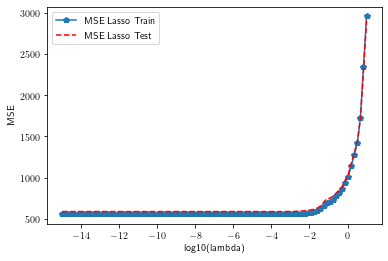

Min MSE using Lasso:  585.72
Lambda = 10^(-3.69)


In [33]:
from sklearn.model_selection import train_test_split
import sklearn.linear_model as skl
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

np.random.seed(3155)

n = 10
N = 100
terrain = terrain1[:N, :N]
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
mx, my = np.meshgrid(x, y)
z = terrain
X = create_X(mx, my, n=n)

X_train, X_test, z_train, z_test = train_test_split(X, z.ravel(), test_size=0.2) #X contains both x and y coordinates
nlambdas = 100; lambdas = np.logspace(-15, 1, nlambdas)
Lasso_MSEPredict = np.zeros(nlambdas); Lasso_MSETrain = np.zeros(nlambdas)

for i in range(nlambdas):
    
    lmb = lambdas[i]
    
    #lasso
    lassofit = skl.Lasso(alpha=lmb).fit(X_train,z_train)
    lassoz_train = lassofit.predict(X_train)
    lassoz_test = lassofit.predict(X_test)
    
    Lasso_MSEPredict[i] = mean_squared_error(z_test,lassoz_test)
    Lasso_MSETrain[i] = mean_squared_error(z_train,lassoz_train)
    
  
plt.figure()

plt.plot(np.log10(lambdas), Lasso_MSETrain, 'p-', label = 'MSE Lasso Train')
plt.plot(np.log10(lambdas), Lasso_MSEPredict, 'r--', label = 'MSE Lasso Test')
print(min(Lasso_MSEPredict))
plt.xlabel('log10(lambda)')
plt.ylabel('MSE')
plt.legend()
plt.show()

print("Min MSE using Lasso: % .2f" % min(Lasso_MSEPredict))
print("Lambda = 10^(% .2f)" % np.log10(lambdas[np.argmin(Lasso_MSEPredict)]))


### Bootstrap sampling 

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.214720559224538, tolerance: 1.3648200000000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.388472027469057, tolerance: 2.04603875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.06080627947151, tolerance: 1.819195
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Obj

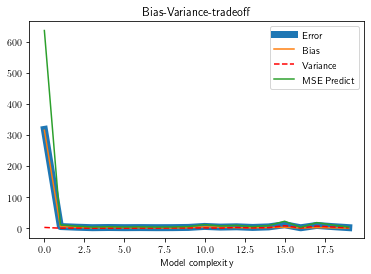

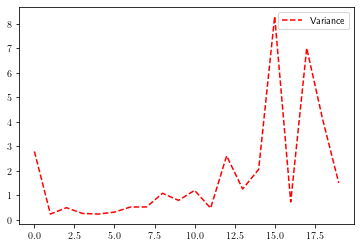

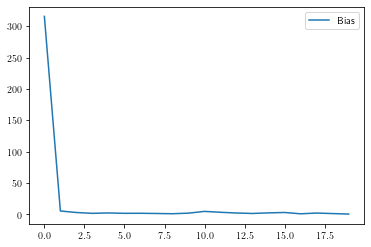

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.21256220728675, tolerance: 1.7155200000000002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.227097744003025, tolerance: 1.90279875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.196517567931885, tolerance: 2.078875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Ob

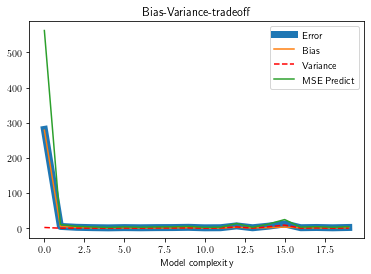

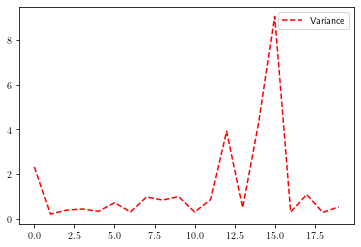

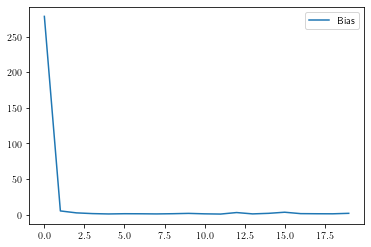

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.074037205410704, tolerance: 1.6713550000000004
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.640126292246435, tolerance: 1.768
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.252788084668708, tolerance: 1.93238875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Obje

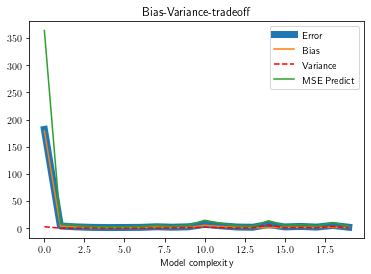

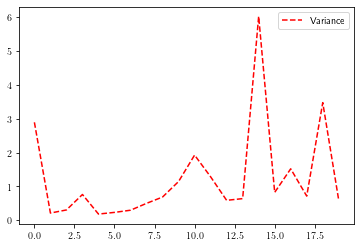

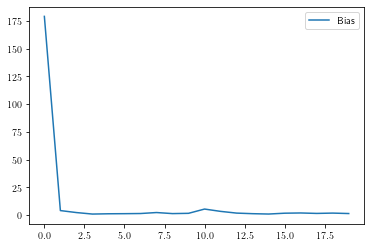

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.256964560362437, tolerance: 1.97002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.11080192417085, tolerance: 1.62658875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.39033081996788, tolerance: 1.51054875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective di

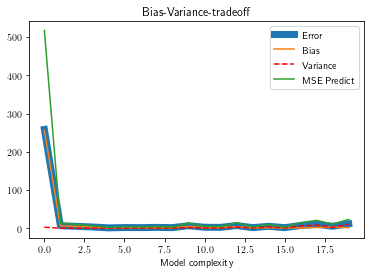

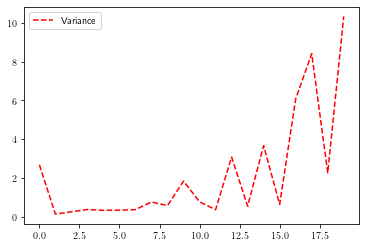

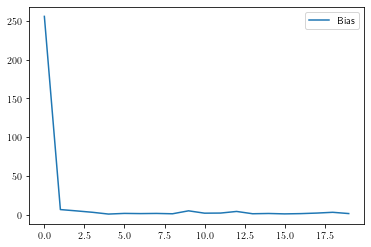

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.102326190827625, tolerance: 2.017555
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.90896869158348, tolerance: 2.0200487500000004
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.896834056716674, tolerance: 1.7178887500000002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWar

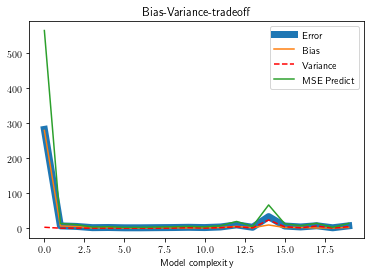

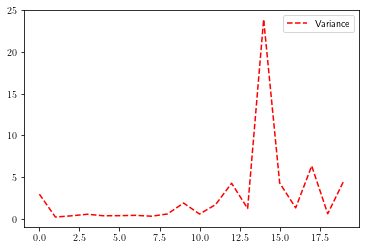

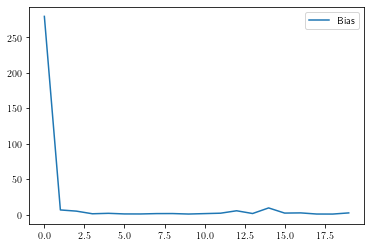

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47.099297899745984, tolerance: 1.9778799999999996
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.23732949760806, tolerance: 2.17269875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.02430294073564, tolerance: 1.8806200000000002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWa

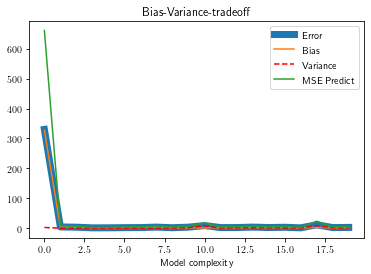

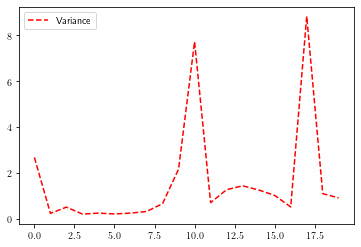

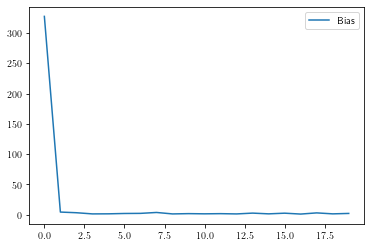

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.00811896708251, tolerance: 1.7233949999999998
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.98303333345149, tolerance: 1.64542
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.218965268875138, tolerance: 1.52863875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Obje

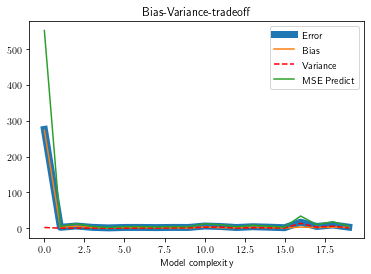

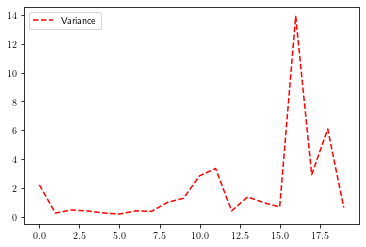

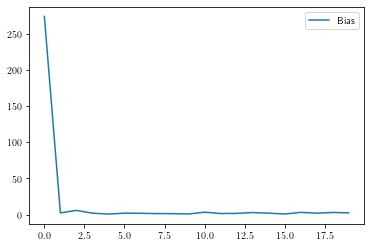

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.033377016404323, tolerance: 1.84949875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.017322298293532, tolerance: 1.6955949999999997
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.355633695691008, tolerance: 2.14924875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning:

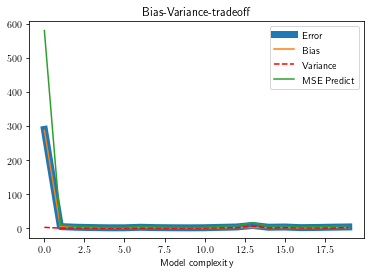

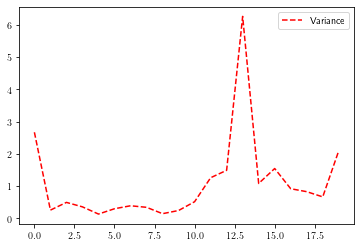

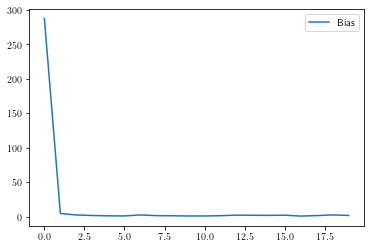

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.957925813368043, tolerance: 1.6226387500000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.210838164230857, tolerance: 1.38454875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.06745904807842, tolerance: 1.1507687500000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceW

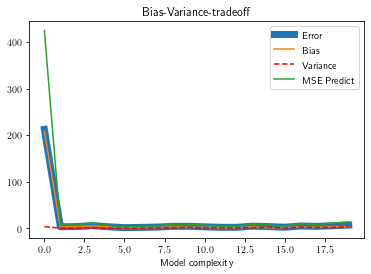

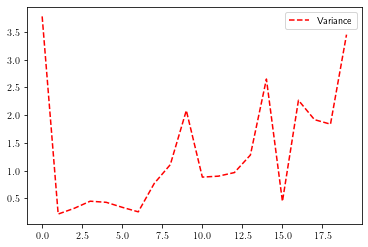

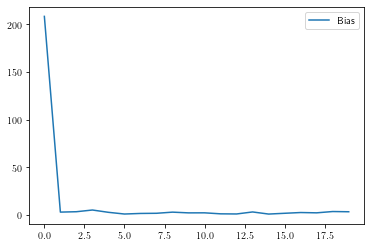

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.410203289155394, tolerance: 1.43031875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.03168614303624, tolerance: 1.7682200000000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.34053317015957, tolerance: 1.5059
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objec

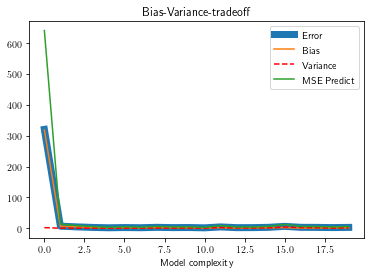

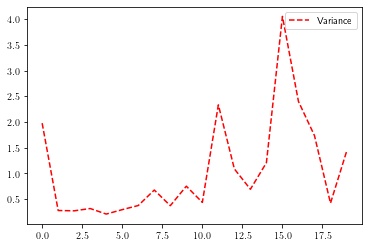

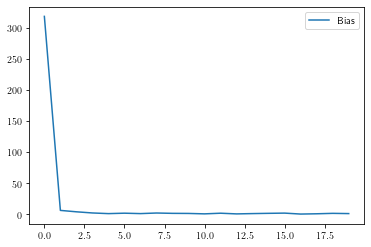

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42.68407730284129, tolerance: 1.52282
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.173221811774518, tolerance: 1.7503950000000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42.23935611991102, tolerance: 2.31598875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Obje

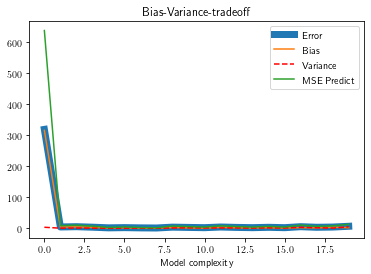

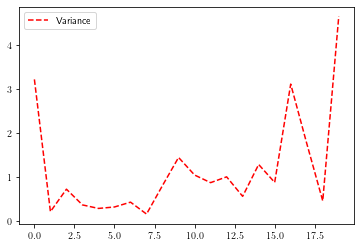

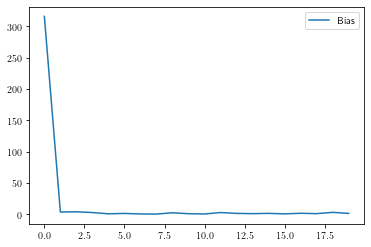

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.437855621422607, tolerance: 1.6785387499999997
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.277291594359934, tolerance: 1.3965687500000001
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.263926518018287, tolerance: 1.594355
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWa

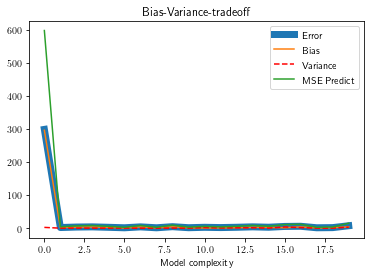

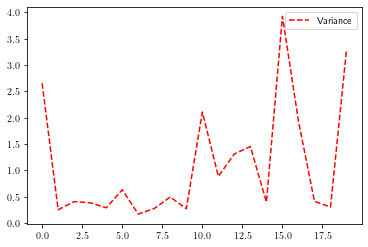

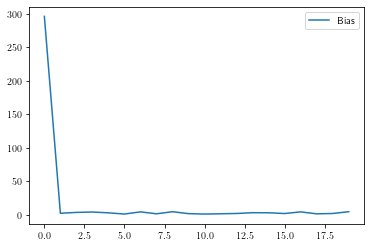

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.31920411447246, tolerance: 1.07108
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.05868937491193, tolerance: 1.6443949999999998
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.78480927931404, tolerance: 1.45849875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objec

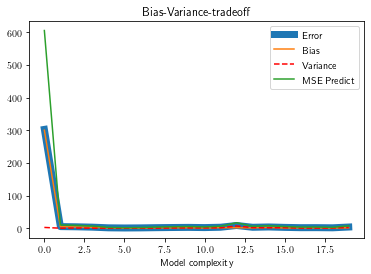

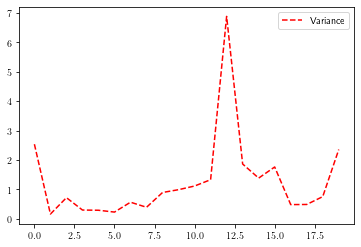

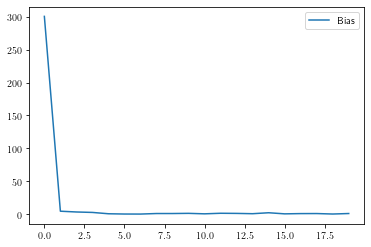

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.32874966489585, tolerance: 2.32596875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.88570969547847, tolerance: 2.09176875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.622259835644172, tolerance: 2.0158799999999997
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: O

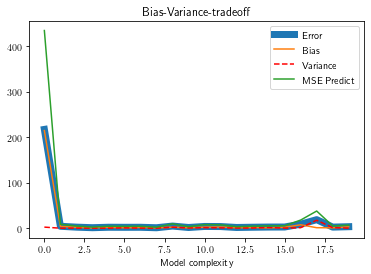

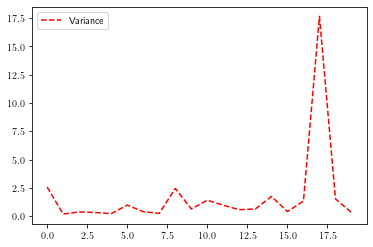

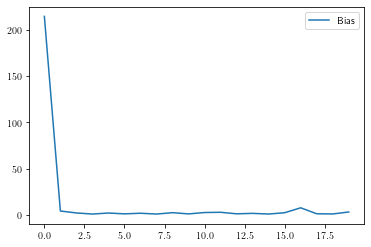

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.96985258974187, tolerance: 2.4275387499999996
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.475061825845035, tolerance: 1.56779875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.16268827325872, tolerance: 1.99878875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: O

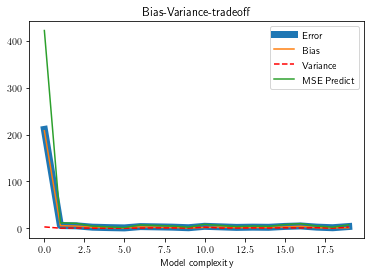

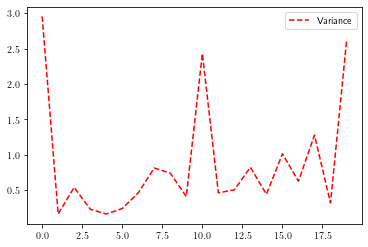

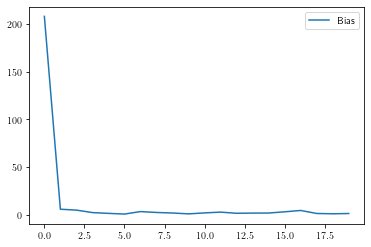

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.0450854152910125, tolerance: 1.59838
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.64772128098864, tolerance: 1.7732750000000002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.51798186993359, tolerance: 2.1687487500000002
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarni

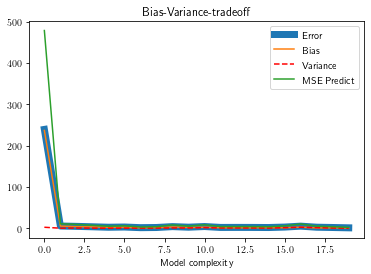

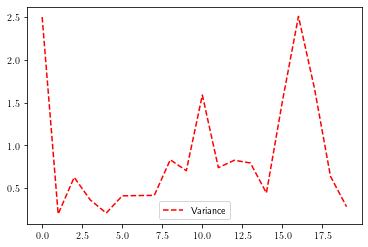

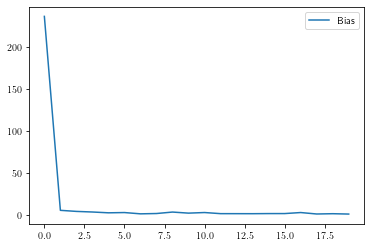

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.626984681657717, tolerance: 1.744675
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.652762145393766, tolerance: 1.77486875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.598840644301873, tolerance: 1.79018
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective di

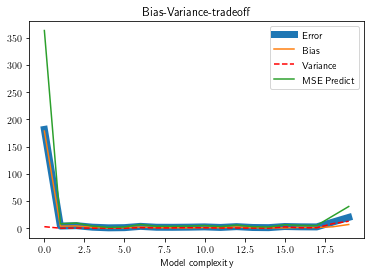

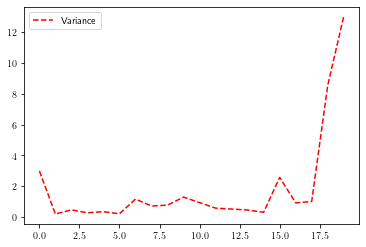

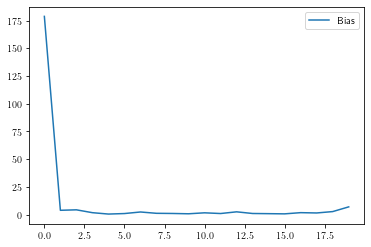

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.535234393957946, tolerance: 1.625555
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.20315201087518, tolerance: 2.116355
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.961649676001887, tolerance: 1.61798875
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective di

In [ ]:
np.random.seed(3155)

N = 10
terrain = terrain1[:N, :N]
z = terrain
x = np.linspace(0, 1, np.shape(terrain)[0])
y = np.linspace(0, 1, np.shape(terrain)[1])
mx, my = np.meshgrid(x, y)

#random lambda value
nlambdas = 21; lambdas = np.logspace(-15, 5, nlambdas)

MSE_l_d_mean = np.zeros((maxdegree, nlambdas))
MSE_l_d_std  = np.zeros((maxdegree, nlambdas))
MSE_l_d_var = np.zeros((maxdegree, nlambdas))
R2_l_d = np.zeros((maxdegree, nlambdas))
MSE_n = np.zeros(n_bootstraps)
R2_n = np.zeros(n_bootstraps)

n_boostraps = 100
    
maxdegree = 20
error = np.zeros(maxdegree); bias = np.zeros(maxdegree); variance = np.zeros(maxdegree)
error_train = np.zeros(maxdegree); bias_train = np.zeros(maxdegree); variance_train = np.zeros(maxdegree)
polydegree = np.zeros(maxdegree); MSE_Predict = np.zeros(maxdegree)
for j in range(nlambdas): 
    lmb = lambdas[j]
    for degree in range(maxdegree):
    
        X = create_X(mx, my, n=degree)
        I = np.eye(X.shape[1],X.shape[1])
        X_train, X_test, z_train, z_test = train_test_split(X, z.ravel(), test_size=0.2)
        z_pred = np.zeros((z_test.shape[0], n_boostraps)) #n data points for test set as rows and number of columns for bootstrap iterations
    
        for i in range(n_boostraps):
            x_, z_ = resample(X_train, z_train)
        
            lassofit = skl.Lasso(alpha=lambdavalue,fit_intercept=True).fit(x_,z_)
            zp = lassofit.predict(X_test)
            z_pred[:, i] = lassofit.predict(X_test)
            MSE_n[i] = MSE(z_test, zp)
            R2_n[i] = R2(z_test, zp)
        
        MSE_l_d_mean = np.mean(MSE_n)
        MSE_l_d_std = np.std(MSE_n)
        MSE_l_d_var = np.var(MSE_n)
        R2_l_d = np.mean(R2_n)
        polydegree[degree] = degree
    
        error[degree] = np.mean( np.mean((z_test.reshape(-1,1) - z_pred)**2, axis=1, keepdims=True) )
        bias[degree] = np.mean( (z_test.reshape(-1,1) - np.mean(z_pred, axis=1, keepdims=True))**2 )
        variance[degree] = np.mean( np.var(z_pred, axis=1, keepdims=True) )
        MSE_Predict[degree] = bias[degree] + variance[degree] + error[degree]
    
    plt.plot(polydegree, error, linewidth=7, label='Error')
    plt.plot(polydegree, bias, label='Bias')
    plt.plot(polydegree, variance, 'r--', label='Variance')

    plt.plot(polydegree, MSE_Predict, label='MSE Predict')

    plt.xlabel('Model complexity'); plt.title('Bias-Variance-tradeoff'); 
    plt.legend(); plt.show()

    #plt.figure()
    #plt.plot(polydegree, MSE_Train,label='MSE Train'); 
    #plt.plot(polydegree, MSE_Predict, label='MSE Predict')
    #plt.xlabel('Model complexity'); plt.ylabel('MSE'); plt.title('MSE vs Model complexity'); plt.legend(); plt.show()

    plt.plot(polydegree, variance, 'r--', label='Variance'); plt.legend(); plt.show()
    plt.plot(polydegree, bias, label='Bias'); plt.legend(); plt.show()
    
min_val = []
min_d = []
for i in range(nlambdas): 
    min_d.append(np.argmin(MSE_l_d_mean[:, i]))
    min_val.append(min(MSE_l_d_mean[:, i]))

min_lambda = np.argmin(min_val)
min_degree = min_d[min_lambda]


#print(np.argmin(min_val))
#print(min_d[min_lambda])
#print(MSE_l_d_mean[min_degree, min_lambda])
lowest_MSE = MSE_l_d_mean[min_degree, min_lambda]
STD_lowest_MSE = MSE_l_d_std[min_degree, min_lambda]
var_lowest_MSE = MSE_l_d_var[min_degree, min_lambda]
print("Lowest MSE: {:e}, std: {:e}".format(lowest_MSE, STD_lowest_MSE))

plt.contourf(np.log10(lambdas), polydegree, MSE_l_d_mean); plt.plot(np.log10(lambdas[min_lambda]), min_degree, "w+"); plt.text(np.log10(lambdas[min_lambda])+0.4, min_degree+0.4, "min MSE", color = "w")
plt.xlabel(r'$log_{10}(\lambda)$'); plt.ylabel('Degree of polynomial'); cb = plt.colorbar(); cb.set_label(label="MSE", size=14)
save_fig('BestlambdadegreeLassoTERRAIN'); plt.show()

### Bootstrap analysis of Lasso against lambda

In [ ]:
np.random.seed(3155)

# Setting up lambdavalues and arrays for storage of information
nlambdas = 100; lambdas = np.logspace(-20, 5, nlambdas)
error = np.zeros(nlambdas); bias = np.zeros(nlambdas); variance = np.zeros(nlambdas)
MSE_predict = np.zeros(nlambdas)

# setting up meshgrid of values and dataset
N = 100; terrain = terrain1[:N, :N]; n = 12
x = np.linspace(0, 1, N); y = np.linspace(0, 1, N) 
mx, my = np.meshgrid(x, y)
z = terrain
z = z.ravel()
# Design matrix
X = create_X(mx, my, n=n)
# Splitting into train and test sets
X_train, X_test, z_train, z_test = train_test_split(X, z, test_size=0.2)
X_offset = np.mean(X_test, axis=0); z_offset = np.mean(z_train, axis=0)
# Identity matrix
I = np.eye(X_train.shape[1], X_train.shape[1])
n_bootstraps = 100 # number of iterations in resampling
# looping through lambdavalues in lambdas
for lmbda in range(nlambdas): 
    l = lambdas[lmbda]
    lasso = skl.Lasso(alpha=l)#.fit(X_train,z_train) # Setting up lasso using skl with lambdavalue
    zpred = np.zeros((z_test.shape[0], n_bootstraps))
    for i in range(n_bootstraps): 
        # Resampling
        x_, z_ = resample(X_train, z_train)
        # Finding lassofit using x_ and z_ (resampled data) 
        lassofit = lasso.fit(x_, z_) 
        # Performing regression
        lassoz_train = lassofit.predict(x_)
        zpred[:, i] = lassofit.predict(X_test)
    # Collecting data
    error[lmbda] = np.mean( np.mean((z_test.reshape(-1,1)-zpred)**2, axis=1, keepdims=True))
    bias[lmbda] = np.mean( (z_test.reshape(-1,1) - np.mean(zpred, axis=1, keepdims=True))**2 )
    variance[lmbda] = np.mean( np.var(zpred, axis=1, keepdims=True) )
    MSE_predict[lmbda] = bias[lmbda] + variance[lmbda] + error[lmbda]
# Plotting error, bias, variance and predicted MSE against log10(lambda)
plt.plot(np.log10(lambdas), error, linewidth=7, label='Error')
plt.plot(np.log10(lambdas), bias, label='Bias')
plt.plot(np.log10(lambdas), variance, 'r--', label='Variance')
plt.plot(np.log10(lambdas), MSE_predict, label='MSE Predict')
plt.xlabel('log10(lambda)'); plt.title('Bias-Variance-tradeoff'); 
plt.legend(); plt.show()
# Plotting variance against log10(lambda)
plt.plot(np.log10(lambdas), variance, label="Variance")
plt.legend()
plt.show()
# Plotting bias against log10(lambda)
plt.plot(np.log10(lambdas), bias, label="Bias")
plt.legend()
plt.show()

### Cross validation Lasso

/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 638257.0573344136, tolerance: 3199.363150775
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 638129.5804830496, tolerance: 3199.363150775
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 637865.8495766055, tolerance: 3199.363150775
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning

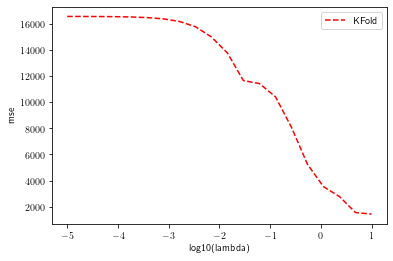

In [36]:
import sklearn.linear_model as skl
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold #new
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score #new
from sklearn.preprocessing import PolynomialFeatures

np.random.seed(3155)

nlambdas = 20; lambdas = np.logspace(-5, 1, nlambdas)

n = 5
N = 100
terrain = terrain1[:N, :N]
x = np.sort(np.random.uniform(0, 1, N))
y = np.sort(np.random.uniform(0, 1, N))
mx, my = np.meshgrid(x, y)
z = terrain
z_arr = z.ravel()
X = create_X(mx, my, n=n)

def crossvalidation_lasso(k, nlambdas,lambdas):
    
    scores_KFold = np.zeros((nlambdas,k))

    x_indices = np.arange(len(X))
    x_splits = np.array_split(x_indices, k)
    concat_pre = np.arange(len(x_splits))
    
    for k in range(len(x_splits)):
        test_inds = x_splits[k]
        concat = np.delete(concat_pre, k)

        #find and concatenate training data
        if (len(concat)-1) == 0:
                train_inds = x_splits[concat[0]]
        else:
            for v in range(len(concat)-1):
                train_inds = np.concatenate((x_splits[concat[v]], x_splits[concat[v+1]]))
       
        xtrain = X[train_inds]
        ztrain = z_arr[train_inds]

        xtest = X[test_inds]
        ztest = z_arr[test_inds]
    
        scaler = StandardScaler(); scaler.fit(xtrain)
        xtrain = scaler.transform(xtrain)
        xtest = scaler.transform(xtest)
    
        #for different values of lambda
        for j in range(len(lambdas)):
    
            lassofit = skl.Lasso(alpha=lambdas[j]).fit(xtrain,ztrain)
            z_pred = lassofit.predict(xtest)
    
            scores_KFold[j,k] = np.sum((z_pred - ztest)**2)/np.size(z_pred)

    estimated_mse_KFold = np.mean(scores_KFold,axis=1)
    
    return estimated_mse_KFold

#for k in range(5,10+1):
#    print('k-fold: ', k, '     ', crossvalidation_ridge(k))

estimated_mse_KFold = crossvalidation_lasso(5, nlambdas, lambdas)

plt.figure()
#plt.plot(np.log10(lambdas), estimated_mse_sklearn, label = 'cross_val_score')
plt.plot(np.log10(lambdas), estimated_mse_KFold, 'r--', label = 'KFold')
plt.xlabel('log10(lambda)'); plt.ylabel('mse')
plt.legend(); plt.show()

In [37]:
def crossvalidation_lassoscikit(k, n, lmb):
    kfold = KFold(n_splits = k) 
    lassofit = skl.Lasso(alpha=lmb)
    estimated_mse_folds = cross_val_score(lassofit, X, z_arr[:, np.newaxis], scoring='neg_mean_squared_error', cv=kfold)
    estimated_mse_sklearn = np.mean(-estimated_mse_folds)
    return estimated_mse_sklearn

print('        ', '      ', 'crossvalidation scikit', '    ','crossvalidation lasso')
a = 5
b = 11
lasso_owncv_mse = np.zeros(b-a)
lasso_scicv_mse = np.zeros(b-a)
for k in range(a, b):
    print('k-fold: ', k, '     ', crossvalidation_lassoscikit(k, 1, 1e-4), '       ', crossvalidation_lasso(k, 1, [1e-4]))
    lasso_owncv_mse[k-a] = crossvalidation_lasso(k, 1, [1e-4]); lasso_scicv_mse[k-a] = crossvalidation_lassoscikit(k, 1, 1e-4)
    
print(lasso_owncv_mse)
print(lasso_scicv_mse)

                crossvalidation scikit      crossvalidation lasso


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2240889.2356279786, tolerance: 4503.683448487501
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2540807.5152862566, tolerance: 4526.110213987499
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2375602.2612713827, tolerance: 3948.7517654874996
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: Conve

k-fold:  5       4295.791455777168         [16572.25059623]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 637184.3412021003, tolerance: 3199.363150775
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 637184.3412021003, tolerance: 3199.363150775
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 760961.3347586644, tolerance: 3246.548105599999
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarn

k-fold:  6       3569.081975714615         [4605.57061816]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387939.0249191994, tolerance: 2934.4834596338537
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387939.0249191994, tolerance: 2934.4834596338537
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387939.0249191994, tolerance: 2934.4834596338537
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: Conver

k-fold:  7       1446.622979886888         [4784.49960717]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280054.2024500055, tolerance: 2756.402211764706
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280054.2024500055, tolerance: 2756.402211764706
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280054.2024500055, tolerance: 2756.402211764706
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: Convergen

k-fold:  8       1217.1995657866232         [6358.95806986]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246510.1134848725, tolerance: 2608.6893108400004
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246510.1134848725, tolerance: 2608.6893108400004
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246510.1134848725, tolerance: 2608.6893108400004
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: Conver

k-fold:  9       1109.3397473220145         [9855.47934504]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224637.60897362194, tolerance: 2467.96641530153
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224637.60897362194, tolerance: 2467.96641530153
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224637.60897362194, tolerance: 2467.96641530153
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: Convergen

k-fold:  10       1040.8232401669713         [16777.63638913]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207810.56745079186, tolerance: 2310.2512808
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207810.56745079186, tolerance: 2310.2512808
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207810.56745079186, tolerance: 2310.2512808
  model = cd_fast.enet_coordinate_descent(
/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: O

[16572.25059623  4605.57061816  4784.49960717  6358.95806986
  9855.47934504 16777.63638913]
[4295.79145578 3569.08197571 1446.62297989 1217.19956579 1109.33974732
 1040.82324017]


/home/jeb/.local/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3076266.5938466955, tolerance: 3477.612595555552
  model = cd_fast.enet_coordinate_descent(
